<a href="https://colab.research.google.com/github/tiffell/Team-13-Shark-Attack-Project/blob/main/Team_13_Progress_Report_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

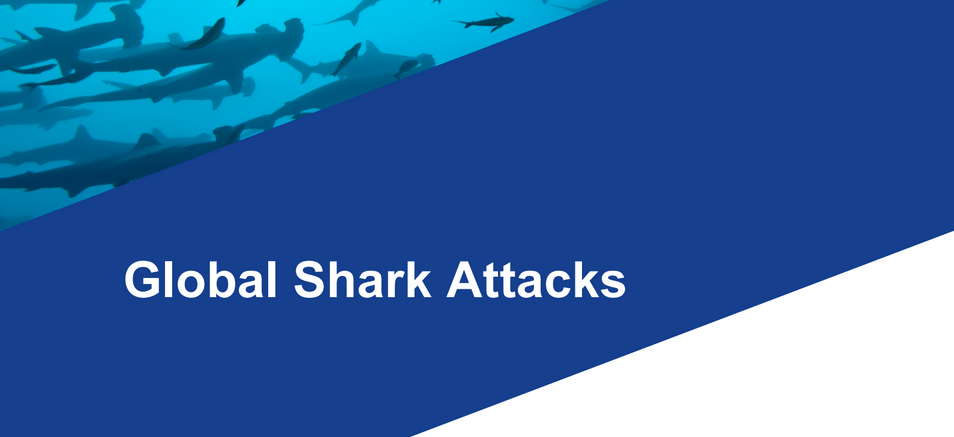

## Global Shark Attack

Course: CS 6330 Data Science

Team: 13

* Tiffany Ellwanger
* Sally Hernanadez
* Cassie Linley-Swartz

Date: May 2, 2025

Set up Access to datasets

In [ ]:
#Allow notebook to access Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
#Load the necessary packages
#Data Manipulation and Analysis
import pandas as pd
import numpy as np

#Preprocessing and Scaling
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler

#Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import folium

#Regular Expressions
import re

#Linear Regression
from sklearn.linear_model import LinearRegression

#Logistic Regression
from sklearn.linear_model import LogisticRegression

#K-Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier

#Clustering and Hierarchical Clustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

#Cross-Validation and Resampling
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold
from sklearn.utils import resample

#Evaluation Metrics
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    make_scorer,
    r2_score,
    accuracy_score,
    classification_report,
    confusion_matrix,
    log_loss
)

#Mathematical Calculations
import math

#Configure Matplotlib
%matplotlib inline

# Project - Progress Report #1.1


## Data Wrangling

###Step 1: Discovering

Read both shark_attack.csv and location_cordinates.csv into their respective dataframes

In [5]:
# read the shark CSV Files into dataframe
df = pd.read_csv('/content/drive/MyDrive/shark_attack.csv')

# read the location file for latitude and longitute
location_df = pd.read_csv('/content/drive/MyDrive/location_coordinates.csv')

Info about the shark attack dataframe

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6890 entries, 0 to 6889
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Date                    6587 non-null   object 
 1   Year                    6758 non-null   float64
 2   Type                    6871 non-null   object 
 3   Country                 6839 non-null   object 
 4   Area                    6409 non-null   object 
 5   Location                6325 non-null   object 
 6   Activity                6304 non-null   object 
 7   Name                    6670 non-null   object 
 8   Sex                     6318 non-null   object 
 9   Age                     3903 non-null   object 
 10  Injury                  6853 non-null   object 
 11  Fatal (Y/N)             6890 non-null   object 
 12  Time                    3372 non-null   object 
 13  Species                 3772 non-null   object 
 14  Investigator or Source  6869 non-null   

From df.info we can see:
* dataset size - 6890 rows and 21 columns
* we have both categorical and numerical columns
* non-null count shows there is some missing data
* most columns are stored as object
* 1.1 MB for memory usages so its easy to process



Info about the location df

In [7]:
location_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6890 entries, 0 to 6889
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   original_Location    6325 non-null   object 
 1   lat                  6015 non-null   float64
 2   lon                  6015 non-null   float64
 3   formatted            6015 non-null   object 
 4   district             1134 non-null   object 
 5   county_code          231 non-null    object 
 6   city                 4930 non-null   object 
 7   name                 3176 non-null   object 
 8   county               4522 non-null   object 
 9   state                5640 non-null   object 
 10  state_code           4836 non-null   object 
 11  country              5936 non-null   object 
 12  country_code         5961 non-null   object 
 13  confidence           5880 non-null   float64
 14  attribution          5200 non-null   object 
 15  attribution_license  5299 non-null   o

From location_df.info we can see:
* dataset size - 6890 rows and 17 columns
* we have both categorical and numerical columns
* non-null count shows there is some missing data
* most columns are stored as object
* 915 KB for memory usages so its easy to process

Shows the first 10 Rows of the Shark Dataset

In [8]:
df.head(10)

,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,...,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href formula,href,Case Number,Case Number.1,original order
0,2023-07-03,2023.0,Unprovoked,USA,New York,"Beach 3, Robert Moses State Park, Suffolk County",Swimming,female,F,15,...,N,13h45,Sand tiger shark,"S.S. Curatolo- Wagemann, GSAFF",NaN,NaN,NaN,NaN,NaN,NaN
1,2023-03-17,2023.0,Questionable,MEXICO,Quintana Roo,Cancún,Swimming,Dillon Armijo,M,10,...,N,NaN,Authorities report injury caused bya barracuda,"Denver7, 3/29/2023",NaN,NaN,NaN,NaN,NaN,NaN
2,2022-12-30,2022.0,Provoked,South Africa,KNZ,Protea Banks,Diving/Shark Feeding,Ranier Kruger,M,26,...,N,09h00,Blacktip,"A Currie, GSAF",NaN,NaN,NaN,NaN,NaN,NaN
3,2022-07-16,2022.0,Unprovoked,USA,Florida,"Daytona Beach Shores, Volusia County",NaN,Tasa Summers,F,40,...,N,13h12,A small shark,"WESH, 717,2022",2022.07.16-Summers.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2022.07.16,2022.07.16,6785.0
4,2022-07-01,2022.0,Unprovoked,EGYPT,"Hurghada, Red Sea Governorate",Sahl Hasheesh,Swimming,Elisabeth Sauer,F,68,...,Y,NaN,"Oceaniic whitetip shark/tiger shark, 2m shark","M. Michaeilson, GSAF",2022.07.01.a-Sauer.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2022.07.01.a,2022.07.01.a,6775.0
5,2022-01-06,2022.0,Unprovoked,USA,Florida,"Anna Maria Island, Manatee County",Wing Foil Surfing,Erika Lane,F,42,...,N,14h45,Blacktip or spinner shark,ABC.net,2022.01.06.R-Lane.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2022.01.06.R,"2022,91,06.R",6729.0
6,NaN,2021.0,Unprovoked,BRAZIL,São Paulo.,Boqueirão Beach,Playing,male,M,11,...,UNKNOWN,12h00,dogfish,"K. McMurray, TrackingSharks.com",2021.11.15-Brazil.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2021.11.15,2021.11.15,6718.0
7,2021-07-10,2021.0,Unprovoked,USA,Florida,"Bathtub Beach, Martin County",Playing,Amiya Lobb-Smith,F,9,...,N,16h39,"Spinner shark, 4'?","J. Marchand, GSAF",2021.07.10.c-Lobb-Smith.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2021.07.10.c,2021.07.10.c,6682.0
8,2021-01-21,2021.0,Unprovoked,AUSTRALIA,South Australia,Port MacDonnell,Snorkeling,Duncan Craw,M,32,...,Y,17h00,White shark,"S. DeMarchi & R. Babington, GSAF and K. McMurr...",2021.01.21-Craw.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2021.01.21,2021.01.21,6625.0
9,2020-05-26,2020.0,Unprovoked,SPAIN,Canary Islands,"Famara Beach, Lanzarote",Playing,male,M,9,...,N,NaN,Angel shark,"K. McMurray, TrackingSharks.com",2020.05.26-Lanzarote.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2020.05.26,2020.05.26,6543.0


Shows the first 10 Rows of the Location Dataset

In [9]:
location_df.head(10)

,original_Location,lat,lon,formatted,district,county_code,city,name,county,state,state_code,country,country_code,confidence,attribution,attribution_license,attribution_url
0,"Beach 3, Robert Moses State Park, Suffolk County",40.938789,-72.685211,"Suffolk County, NY, United States of America",NaN,NaN,NaN,Suffolk County,Suffolk County,New York,NY,United States,us,0.0,NaN,NaN,https://www.whosonfirst.org/docs/licenses/
1,Cancún,43.884420,125.318100,"130000 Jilin, China",NaN,NaN,Changchun City,NaN,NaN,Jilin,NaN,China,cn,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
2,Protea Banks,-30.833330,30.483330,Protea Banks,NaN,NaN,NaN,Protea Banks,NaN,NaN,NaN,NaN,NaN,0.0,NaN,CC BY 4.0,https://www.geonames.org/datasources/
3,"Daytona Beach Shores, Volusia County",29.176093,-80.982832,"Daytona Beach Shores, FL, United States of Ame...",NaN,NaN,Daytona Beach Shores,NaN,Volusia County,Florida,FL,United States,us,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
4,Sahl Hasheesh,27.048445,33.886844,"Sahl Hasheesh, Red Sea, Egypt",NaN,NaN,NaN,Sahl Hasheesh,NaN,Red Sea,NaN,Egypt,eg,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
5,"Anna Maria Island, Manatee County",27.529382,-82.732472,"Anna Maria island, FL 34216, United States of ...",NaN,NaN,Anna Maria island,NaN,Manatee County,Florida,FL,United States,us,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
6,Boqueirão Beach,-8.790677,-37.221751,"Boqueirão, Boqueirão - Northeast, Brazil",NaN,NaN,Boqueirão,NaN,Pernambuco,Northeast,NaN,Brazil,br,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
7,"Bathtub Beach, Martin County",27.185883,-80.160716,"Bathtub Beach, Seminole Shores, FL, United Sta...",NaN,NaN,Seminole Shores,Bathtub Beach,Martin County,Florida,FL,United States,us,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
8,Port MacDonnell,-38.051887,140.700406,"Port MacDonnell SA 5291, Australia",NaN,NaN,Port MacDonnell,NaN,NaN,South Australia,SA,Australia,au,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
9,"Famara Beach, Lanzarote",29.076505,-13.662726,"Camino Famara, Tinajo, Spain",NaN,GC,Tinajo,NaN,Las Palmas,Canary Islands,NaN,Spain,es,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright


Shows the last 10 Rows of the Shark Dataset

In [10]:
df.tail(10)

,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,...,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href formula,href,Case Number,Case Number.1,original order
6880,1844-01-01,1844.0,Unprovoked,MADAGASCAR,NaN,NaN,Fell overboard,Mr. Andrews,M,NaN,...,Y,NaN,NaN,GSAF,1844.00.00-Andrews.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,1844.00.00,1844.00.00,249.0
6881,1803-05-17,1803.0,Sea Disaster,USA,South Carolina,Off Charleston,NaN,Captain Jones,M,NaN,...,N,NaN,NaN,"Evening Post, 6/13/1803",1803.05.17-Jones.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,1803.05.17,1803.05.17,181.0
6882,1785-09-26,1785.0,Unprovoked,ENGLAND,Sussex,Brighton,NaN,NaN,M,NaN,...,Y,NaN,Tiger shark?,"C. Moore, GSAF",1785.09.26.R-Brighton.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,1785.09.26.R,1785.09.26.R,170.0
6883,1723-01-01,1723.0,Unprovoked,ROATAN,NaN,NaN,NaN,Philip Ashton,M,NaN,...,UNKNOWN,NaN,NaN,"C.Moore, GSAF",1730.00.00-Ashton.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,1723.00.00,1723.00.00,151.0
6884,1638-01-01,1638.0,Unprovoked,NaN,NaN,NaN,NaN,sailors,M,NaN,...,UNKNOWN,NaN,NaN,Sir Thomas Herbert,1638.00.00.R-Herbert,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,1638.00.00.R,1638.00.00.R,144.0
6885,NaN,NaN,NaN,PERU,Paloma,Archeological site,NaN,male,M,17,...,Y,NaN,NaN,J. Quilter,4000BC-Peru.jpg,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,4000.BC-Peru,4000BC,125.0
6886,NaN,NaN,Unprovoked,AUSTRALIA,Queensland,Moreton Bay,Fell into the water,Lieutenant Hexton,M,NaN,...,Y,NaN,NaN,"Brisbane Courier, 1/28/1909",ND-0138-Hexton.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,ND-0138,ND-0138,112.0
6887,NaN,NaN,Unprovoked,SUDAN,Red Sea State,Sha'ab Rumi,Diving,Erik Bjurstrom,M,NaN,...,N,NaN,Silvertip shark,"E. Bjurstrom,",ND-0091-Bjurstrom-RedSea.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,ND.0091,ND.0091,81.0
6888,NaN,NaN,Unprovoked,VANUATU,Malampa Province,Malakula,NaN,female,F,NaN,...,Y,NaN,NaN,S. Combs,ND-0090-Vanuatu-female.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,ND.0090,ND.0090,80.0
6889,NaN,NaN,Unprovoked,SAUDI ARABIA,Eastern Province,East of the Ras Tanura-Jubail area,Diving,a fisherman / diver,M,NaN,...,N,NaN,6' shark,G.F. Mead,ND-0036-Fisherman-SaudiArabia.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,ND.0036,ND.0036,36.0


From the data above we can see that the columns titled: 'Investigator or Source', 'pdf', 'href formula', 'href', 'Case Number', 'Case Number.1', 'original order' have no useful information so we will drop them in the cleaning step.

Shows the last 10 Rows of the location df

In [11]:
location_df.tail(10)

,original_Location,lat,lon,formatted,district,county_code,city,name,county,state,state_code,country,country_code,confidence,attribution,attribution_license,attribution_url
6880,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6881,Off Charleston,32.871987,-80.017479,"Saks Off 5th, 4840 Tanger Outlet Boulevard, No...",NaN,NaN,North Charleston,Saks Off 5th,Charleston County,South Carolina,SC,United States,us,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
6882,Brighton,50.821463,-0.140056,"Brighton, BN1 1HH, United Kingdom",NaN,ESX,Brighton,Brighton,East Sussex,England,ENG,United Kingdom,gb,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
6883,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6884,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6885,Archeological site,-14.750822,-75.073792,"Archeological site, Nazca, ICA, Peru",NaN,NaN,Nazca,Archeological site,NaN,Ica,ICA,Peru,pe,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
6886,Moreton Bay,-27.239782,153.253999,"Moreton Bay, Australia",Moreton Bay,NaN,NaN,Moreton Bay,NaN,Queensland,QLD,Australia,au,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
6887,Sha'ab Rumi,19.941332,37.406872,Shaab Rumi,NaN,NaN,NaN,Shaab Rumi,NaN,NaN,NaN,NaN,NaN,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
6888,Malakula,-16.234392,167.499172,"Malekula, Malampa, Vanuatu",NaN,NaN,NaN,Malekula,NaN,Malampa,NaN,Vanuatu,vu,0.0,© OpenStreetMap contributors,Open Database License,https://www.openstreetmap.org/copyright
6889,East of the Ras Tanura-Jubail area,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Based on the sample, the following columns do not contain useful data and can be dropped later: 'Formatted', 'Country', 'Confidence', 'Attribution', 'Attribution_License', and 'Attribution_Url'.

Get summary of stats of numeric column in shark df

In [12]:
df.describe()

,Year,original order
count,6758.000000,6799.000000
mean,1970.935928,3401.152081
std,56.227881,1963.076319
min,1.000000,2.000000
25%,1950.000000,1701.500000
50%,1986.000000,3401.000000
75%,2009.000000,5100.500000
max,2023.000000,6802.000000


Year has 6,758 non-null values that range from 1 to 2023. 1 as a year indicates their may be incorrect data. Median is 1986 and 75% of values are less than 2009

Original order has 6,799 values that range from 2 to 6802. The median is 3401 which indicates this is sequential.

Get summary of stats of numeric column in location df

In [13]:
location_df.describe()

,lat,lon,confidence
count,6015.000000,6015.000000,5880.000000
mean,13.409948,-8.521346,0.006973
std,30.789957,99.597328,0.083219
min,-66.664771,-179.998120,0.000000
25%,-21.210850,-80.927127,0.000000
50%,26.934225,-60.173398,0.000000
75%,35.232055,73.854454,0.000000
max,76.804658,179.989880,1.000000


Lat has a range of -66.66 to 76.80 which is valid since the range for latitude is -90 to 90. The Median is 26.93 which indicates many points are in the Northen Hempishere.

Lon has a range of -179.99 to 179.99 which is valid since the range for longitude is -180 to 180. The Median is 60.17 which indicates many points are in the Western Hempishere.

Overall the data looks clean and valid.



Columns of the dataset

In [14]:
df.columns

Index(['Date', 'Year', 'Type', 'Country', 'Area', 'Location', 'Activity',
       'Name', 'Sex', 'Age', 'Injury', 'Fatal (Y/N)', 'Time', 'Species',
       'Investigator or Source', 'pdf', 'href formula', 'href', 'Case Number',
       'Case Number.1', 'original order'],
      dtype='object')

In [15]:
location_df.columns

Index(['original_Location', 'lat', 'lon', 'formatted', 'district',
       'county_code', 'city', 'name', 'county', 'state', 'state_code',
       'country', 'country_code', 'confidence', 'attribution',
       'attribution_license', 'attribution_url'],
      dtype='object')

The columns listed above for both datasets reveal that there are two columns listing the 'Country' where attacks occurred. We will determine which column is more useful for our analysis and drop the other during the cleaning step.

In [16]:
print('The Shark dataset has ' + str(df.shape[0]) + ' rows and ' + str(df.shape[1]) + ' columns.')

The Shark dataset has 6890 rows and 21 columns.


In [17]:
print('The location dataset has ' + str(location_df.shape[0]) + ' rows and ' + str(location_df.shape[1]) + ' columns.')

The location dataset has 6890 rows and 17 columns.


###Step 2: Structuring

Consistency and readability focused tex fromatting for both dataframes

In [18]:
#Capitlize Column names for location_df
location_df.columns = location_df.columns.str.title()

#Capitilize Country
df['Country'] = df['Country'].str.upper()


#Make columns have Title Case in shark df
columns_convert = ['Area', 'Location', 'Activity', 'Type', 'Sex', 'Injury', 'Fatal (Y/N)', 'Species', 'Name']
df[columns_convert] = df[columns_convert].apply(lambda x: x.str.title())

#Make columns have Title Case in location df
location_columns = ['Original_Location', 'Lat', 'Lon', 'City', 'Name', 'County', 'State', 'State_Code', 'Country_Code']
string_cols = [col for col in location_columns if location_df[col].dtype == 'object']
location_df[string_cols] = location_df[string_cols].apply(lambda col: col.str.title())

#Truncate long descriptions
df['Activity'] = df['Activity'].str.slice(0, 30)

Type conversion to change all valuues in the following columns to a number and remove decimals

In [19]:
#Convert Age to numeric and remove decimals
df['Age'] = pd.to_numeric(df['Age'], errors='coerce').fillna(0).astype(int)

#Convert Year to numeric and remove decimals
df['Year'] = pd.to_numeric(df['Year'], errors='coerce').fillna(0).astype(int)

Converts Age and Year to a number so any unknowns are replaced with NaN and then filled with 0. Changes them to integars to remove the decimals.

In [20]:
#Convert Date to datetime
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

#Create new Decade column based on year and convert to integar
df['Decade'] = (df['Year'] // 10) * 10

#Move Decade after Year
move_decade = df.pop('Decade')
df.insert(2, 'Decade', move_decade)

#Validate Coordinates
location_df['Lat'] = pd.to_numeric(location_df['Lat'], errors='coerce')
location_df['Lon'] = pd.to_numeric(location_df['Lon'], errors='coerce')
location_df = location_df[(location_df['Lat'].between(-90, 90)) & (location_df['Lon'].between(-180, 180))]

Standardization and Normalization of Age column

In [21]:
#Create Age_Scaled column by standardizing Age (mean = 0, std = 1) without modifying the original Age data
df['Age_Scaled'] = preprocessing.scale(df[['Age']])

#Create Age_Normalized column by scaling Age to a 0–1 range using MinMaxScaler without modifying the original Age data
scaler = MinMaxScaler()
df['Age_Normalized'] = scaler.fit_transform(df[['Age']])

Standardization will help with comparisions. Normalization if we need to use visuals with values between 0 an 1.  

###Step 3 Cleaning

Cleaning Shark_DF

Removing uncessary columns and duplicate rows in shark df

In [22]:
#List columns to remove
remove_columns = ['Investigator or Source', 'pdf', 'href formula', 'href', 'Case Number', 'Case Number.1', 'original order']

#drop columns
shark_df = df.drop(columns=remove_columns, axis=1)

#Remove duplicate rows
shark_df = shark_df.drop_duplicates()

Find missing values in shark df

In [23]:
print(shark_df.isnull().sum())

Date               312
Year                 0
Decade               0
Type                19
Country             51
Area               481
Location           565
Activity           586
Name               220
Sex                572
Age                  0
Injury              37
Fatal (Y/N)          0
Time              3516
Species           3117
Age_Scaled           0
Age_Normalized       0
dtype: int64


Year, Decade, Fatal (Y/N), Age, Age_Scaled, Age_Normalized have no missing values. Type, Country, Injury, Name have a few missing values. Time has 3,516 missing values. Species has 3,117 missing. Activity, Location, and Sex have 500+ missing.

Handle missing values

In [24]:
#Fill in missing values for Age and Species with Unknown
shark_df = shark_df.fillna({'Name': 'Unknown', 'Species': 'Unknown'})

#Handle Missing Values
shark_df.dropna(subset=['Date', 'Location'], inplace=True)

#Transform to values
shark_df['Fatal (Y/N)'] = shark_df['Fatal (Y/N)'].replace({'N': 'No', 'Y': 'Yes'})

Show effect of data cleaning

In [25]:
print(shark_df.isnull().sum())

Date                 0
Year                 0
Decade               0
Type                15
Country             10
Area               212
Location             0
Activity           448
Name                 0
Sex                478
Age                  0
Injury              24
Fatal (Y/N)          0
Time              2808
Species              0
Age_Scaled           0
Age_Normalized       0
dtype: int64


We were able to fully clean Date, Location, and Species. Type, Country, Area, Activity, Name, Sex, and Injury were partially cleaned  filling some values, correcting invalid entries, or removing a subset of rows with missing data.

Save clean dataframe

In [26]:
shark_df.to_csv('shark_clean_df.csv', index=False)

Cleaning location_DF

Removing uncessary columns and duplicate rows in location df

In [27]:
#List columns to remove
remove_location_columns = ['Formatted', 'Country', 'Confidence', 'Attribution', 'Attribution_License', 'Attribution_Url']

#drop columns
location_df = location_df.drop(columns=remove_location_columns, axis=1, errors="ignore")

#Remove duplicate rows
location_df_df = location_df.drop_duplicates()

Standardize formatting and values in location df

In [28]:
#Clean Fatal (Y/N)
#Standardized values to title case, strip whitespace
shark_df['Fatal (Y/N)'] = shark_df['Fatal (Y/N)'].str.strip().str.title()

#Define Valid Categories
valid_fatal_values = ['Yes', 'No', 'Unknown']

#Replace invalid entries with 'Unknown'
shark_df['Fatal (Y/N)'] = shark_df['Fatal (Y/N)'].apply(lambda x: x if x in valid_fatal_values else 'Unknown')

Find columns with missing data in location df

In [29]:
print(location_df.isnull().sum())

Original_Location       0
Lat                     0
Lon                     0
District             4881
County_Code          5784
City                 1085
Name                 2839
County               1493
State                 375
State_Code           1179
Country_Code           54
dtype: int64


Original_Location, Lat, and Long have no missing values. City, Name, County, State,State_Code, Country_Code, have a few missing values. District has 4,881 missing values. County_Code has 5,784 missing.


Handle missing values

In [30]:
#Drop rows where State or Country code are missing
location_df = location_df.dropna(subset=['State', 'Country_Code'], inplace=False)

#Drop columns not necessary with too much missing data
drop_columns = ['District', 'County_Code', 'Name']

location_df = location_df.drop(columns=drop_columns, axis=1, errors='ignore')

Show effect of data cleaning

In [31]:
print(location_df.isnull().sum())

Original_Location       0
Lat                     0
Lon                     0
City                  898
County               1236
State                   0
State_Code            803
Country_Code            0
dtype: int64


Lat, Lon, Orifinal_Location, Country_Code, and State now have 0 missing values. City, County, and State_Code have reduced missing values.

Save clean dataframe

In [32]:
location_df.to_csv('location_clean_df.csv', index=False)

###Step 4 Enriching


Check the available columns

In [33]:
print(location_df.columns)

Index(['Original_Location', 'Lat', 'Lon', 'City', 'County', 'State',
       'State_Code', 'Country_Code'],
      dtype='object')


Join the attack df with the location df

In [34]:
combined_df = pd.concat([shark_df, location_df], axis=1)

Number of attacks based on type

In [35]:
attack_counts = shark_df['Type'].value_counts()
print(attack_counts)

Type
Unprovoked             4515
Provoked                559
Invalid                 483
Watercraft              316
Sea Disaster            162
Questionable             15
Boat                      6
Unverified                1
Under Investigation       1
?                         1
Unconfirmed               1
Name: count, dtype: int64


The majority of attacks are labeled as "Unprovoked" (4,515), followed by "Provoked" (559) and a notable number marked "Invalid" (483), which may indicate data quality issues.

Display the countries with high attack values

In [36]:
country_counts = shark_df['Country'].value_counts()
print(country_counts)

Country
USA                        2412
AUSTRALIA                  1385
SOUTH AFRICA                573
NEW ZEALAND                 133
PAPUA NEW GUINEA            118
                           ... 
IRELAND                       1
GUINEA                        1
PALESTINIAN TERRITORIES       1
GEORGIA                       1
WESTERN SAMOA                 1
Name: count, Length: 156, dtype: int64


USA has the highest number of recorded attacks (2,412), followed by Australia (1,385) and South Africa (573). This may be influenced by coastline size, water activity, and reporting systems.

Count number of attacks by activity, sex, and age

In [37]:
activity_counts = shark_df['Activity'].value_counts()
sex_counts = shark_df['Sex'].value_counts()
age_counts = shark_df['Age'].value_counts()
print(activity_counts)
print(sex_counts)
print(age_counts)

Activity
Surfing                           1094
Swimming                           931
Fishing                            446
Spearfishing                       342
Wading                             160
                                  ... 
Swimming, After Single-Engine        1
Snorkeling On Surface                1
Sailing On Catamaran & Fell In       1
Diving In Sharkey'S Reef Resta       1
Preparing To Go Skin Diving          1
Name: count, Length: 1271, dtype: int64
Sex
M      4880
F       714
N         1
.         1
Lli       1
Name: count, dtype: int64
Age
0     2498
17     166
18     152
15     144
20     142
      ... 
84       1
86       1
81       1
87       1
82       1
Name: count, Length: 80, dtype: int64


Surfing is the most common activity at the time of attack (1,094 cases). Followed by Swimming (931), Fishing (446), and Spearfishing (342).

There were 4,880 male cas, there were unique characters like N or .which need to be changed to unknown.

The most frequent value is 0 (2,498 times) — which is likely a placeholder for missing or unknown age, not actual infants. Most common ages are 17, 18, & 20.

###Step 5 Validating

Validate Datasets

In [38]:
print(combined_df.columns.tolist())

['Date', 'Year', 'Decade', 'Type', 'Country', 'Area', 'Location', 'Activity', 'Name', 'Sex', 'Age', 'Injury', 'Fatal (Y/N)', 'Time', 'Species', 'Age_Scaled', 'Age_Normalized', 'Original_Location', 'Lat', 'Lon', 'City', 'County', 'State', 'State_Code', 'Country_Code']


In [39]:
#Validate columns from the location data that should be numeric
location_columns_to_check = ['Lat', 'Lon']

for column in location_columns_to_check:
    print(f"\n Checking invalid (non-numeric) values in '{column}':")

#Columns from the shark data portion to check for unique values
shark_columns_to_check = ['Type', 'Country', 'Activity', 'Sex', 'Fatal (Y/N)', 'Species']


for column in shark_columns_to_check:
    print(f"\n Unique values in '{column}':")
    print(combined_df[column].unique())



 Checking invalid (non-numeric) values in 'Lat':

 Checking invalid (non-numeric) values in 'Lon':

 Unique values in 'Type':
['Unprovoked' 'Questionable' 'Provoked' 'Unverified' 'Watercraft'
 'Invalid' 'Sea Disaster' nan 'Under Investigation' 'Boat' '?'
 'Unconfirmed']

 Unique values in 'Country':
['USA' 'MEXICO' 'SOUTH AFRICA' 'EGYPT' 'AUSTRALIA' 'SPAIN' 'THAILAND'
 'MAURITIUS' 'BRAZIL' 'CANADA' 'REUNION' 'FIJI' 'GUAM' 'PANAMA' 'VIETNAM'
 'ECUADOR' 'NEW CALEDONIA' 'VANUATU' 'NEW ZEALAND' 'BAHAMAS' 'JAPAN'
 'SOUTH KOREA' 'ITALY' 'PAPUA NEW GUINEA' 'SAMOA' 'SOLOMON ISLANDS'
 'HONG KONG' 'CROATIA' 'TANZANIA' 'IRAN' 'BERMUDA' 'TURKEY' 'PHILIPPINES'
 'CUBA' 'INDIA' 'ENGLAND' 'JAMAICA' 'UNITED ARAB EMIRATES (UAE)'
 'UNITED KINGDOM' 'SOMALIA' 'FRENCH POLYNESIA' 'IRAQ' 'CHINA' 'LIBYA'
 'NIGERIA' 'GREECE' 'COLUMBIA' 'ISRAEL' 'SCOTLAND' 'SEYCHELLES' 'OKINAWA'
 'CHILE' 'INDONESIA' 'SUDAN?' 'SUDAN' 'PACIFIC OCEAN' nan 'NICARAGUA'
 'MARTINIQUE' 'LEBANON' 'TOBAGO' 'BELIZE' 'FRANCE' 'EGYPT / ISRA

There are invalid or inconsistent values, especially in Sex, Country, Activity, Specie. Opportunities for data cleaning, such are grouping similar Activity types or fixing or removing typos in Sex.

Some unique characters were identified as still present in the datasets. We will reassign those to an 'Unknown' category.

In [40]:
#Condense unidentified attack types into unknown category
valid_types = ['Unprovoked', 'Provoked', 'Watercraft', 'Sea Disaster', 'Boat']
shark_df['Type'] = shark_df['Type'].apply(lambda x: x if x in valid_types else 'Unknown')
combined_df['Type'] = combined_df['Type'].apply(lambda x: x if x in valid_types else 'Unknown')

#Clean unique characters in 'Sex' column
valid_sex = ['M', 'F']
shark_df['Sex'] = shark_df['Sex'].apply(lambda x: x if x in valid_sex else 'Unknown')
combined_df['Sex'] = combined_df['Sex'].apply(lambda x: x if x in valid_sex else 'Unknown')

#Remove unique characters in 'Fatal (Y/N)' column
combined_df['Fatal (Y/N)'] = combined_df['Fatal (Y/N)'].astype(str).str.strip().str.title()
shark_df['Fatal (Y/N)'] = shark_df['Fatal (Y/N)'].astype(str).str.strip().str.title()
valid_fatal = ['Yes', 'No']
combined_df['Fatal (Y/N)'] = combined_df['Fatal (Y/N)'].where(combined_df['Fatal (Y/N)'].isin(valid_fatal), 'Unknown')
shark_df['Fatal (Y/N)'] = shark_df['Fatal (Y/N)'].where(shark_df['Fatal (Y/N)'].isin(valid_fatal), 'Unknown')

#Clean 'Activity' column
shark_df['Activity'] = shark_df['Activity'].replace(['nan', ..., None], pd.NA)
shark_df['Activity'] = shark_df['Activity'].fillna('Unknown').str.strip()
combined_df['Activity'] = combined_df['Activity'].replace(['nan', ..., None], pd.NA)
combined_df['Activity'] = combined_df['Activity'].fillna('Unknown').str.strip()

#Clean 'Species' to remove unique characters
def clean_species_name(Species):
    if pd.isna(Species):
        return 'Unknown'

#Look for the last word or phrase ending in 'Shark'
    matches = re.findall(r'([A-Z][a-z]+(?:\s[A-Z][a-z]+)*\sShark)', Species)
    if matches:
        return matches[-1]

    if 'Shark' in Species.upper():
        return 'Unknown Shark'

    return 'Unknown'

#Apply the improved function
shark_df['Species'] = shark_df['Species'].apply(clean_species_name)
combined_df['Species'] = combined_df['Species'].apply(clean_species_name)

View activities with highest shark attacks

In [41]:
combined_df.groupby('Activity')['Fatal (Y/N)'].size().sort_values(ascending=False)

,Fatal (Y/N)
Activity,
Surfing,1094
Swimming,931
Unknown,663
Fishing,446
Spearfishing,342
...,...
"Fishing, Speared Shark Upset C",1
"Fishing, Slipped On Rocks & Fe",1
"Fishing, Sitting In Stern Of S",1


Surfing is the most frequent activity during a Shark attack. Followed by swimming, unknown. fishing, and spearfishing.

View survival outcome of attack by species

In [42]:
combined_df.groupby(['Species', 'Fatal (Y/N)']).size().unstack(fill_value=0).sort_values(by='Yes', ascending=False)

Fatal (Y/N),No,Unknown,Yes
Species,,,
Unknown,2597,701,851
White Shark,476,11,151
Tiger Shark,188,4,70
Bull Shark,143,2,33
Zambesi Shark,19,0,6
...,...,...,...
Whtietip Reef Shark,1,0,0
Wobbegong Shark,47,0,0
Yellow Belly Captive Shark,1,0,0


White Shark has the most fatal shark attacks. Followed by tiger shark, bull shark, and zambesi sharl.

Create pivot table of attacks by decade in each country

In [43]:
pd.pivot_table(combined_df, index='Country', columns='Decade', aggfunc='size', fill_value=0)


Decade,0.0,1700.0,1720.0,1730.0,1740.0,1750.0,1760.0,1770.0,1780.0,1790.0,...,1930.0,1940.0,1950.0,1960.0,1970.0,1980.0,1990.0,2000.0,2010.0,2020.0
Country,,,,,,,,,,,,,,,,,,,,,
ADMIRALTY ISLANDS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
ALGERIA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AMERICAN SAMOA,0,0,0,0,0,0,0,0,0,0,...,0,0,3,0,0,0,0,0,0,0
ANTIGUA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
ARGENTINA,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VANUATU,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,1,4,2,2,0,0
VENEZUELA,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,4,0,0
VIETNAM,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,2,6,0


Step 6 Publishing

Save the cleaned df to CSV file in google drive

In [44]:
shark_df.to_csv('/content/drive/MyDrive/shark_clean_df.csv', index=False)
location_df.to_csv('/content/drive/MyDrive/location_clean_df.csv', index=False)
combined_df.to_csv('/content/drive/MyDrive/combined_clean_df.csv', index=False)

print('Data has been uploaded to Google Drive')

Data has been uploaded to Google Drive


# Progress Report #1.2 - Data Exploration

1. Identify numerical and categorical features in the Barrios dataset and list them out with their ranges and category values.

In [45]:
#Identify Numerical and Categorical Features
location_numerical_features = location_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
location_categorical_features = location_df.select_dtypes(include=['object']).columns.tolist()

print("Numerical Features:", location_numerical_features)
print("Categorical Features:", location_categorical_features)

Numerical Features: ['Lat', 'Lon']
Categorical Features: ['Original_Location', 'City', 'County', 'State', 'State_Code', 'Country_Code']


In [46]:
#Identify Numerical and Categorical Features
shark_numerical_features = shark_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
shark_categorical_features = shark_df.select_dtypes(include=['object']).columns.tolist()

print("Numerical Features:", shark_numerical_features)
print("Categorical Features:", shark_categorical_features)

Numerical Features: ['Year', 'Decade', 'Age', 'Age_Scaled', 'Age_Normalized']
Categorical Features: ['Type', 'Country', 'Area', 'Location', 'Activity', 'Name', 'Sex', 'Injury', 'Fatal (Y/N)', 'Time', 'Species']


### Visualization

2. Show an example of each of the following single feature plots on Barrios dataset. Explain the results of each plot briefly.

Single Feature Plot(Seaborn)

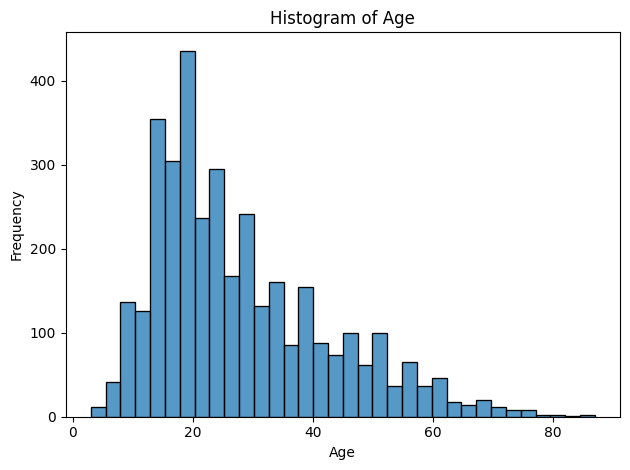

In [47]:
#Filter to only show age above 0
shark_df = shark_df[shark_df['Age'] > 0]

#Create a histogram
sns.histplot(shark_df, x='Age')
plt.title('Histogram of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

Based on this data we can tell this is right-skewed distribution. Most victims are young between ages 10 to 30 years old. There are only a small amount of victims above 60. The highest frequency of incidents occur between ages 15-25, which is likely related to increased water acitivies. Based on the fewer incidents in the elderly it is likely due to less frequent exposure to open water.

Kdeplot

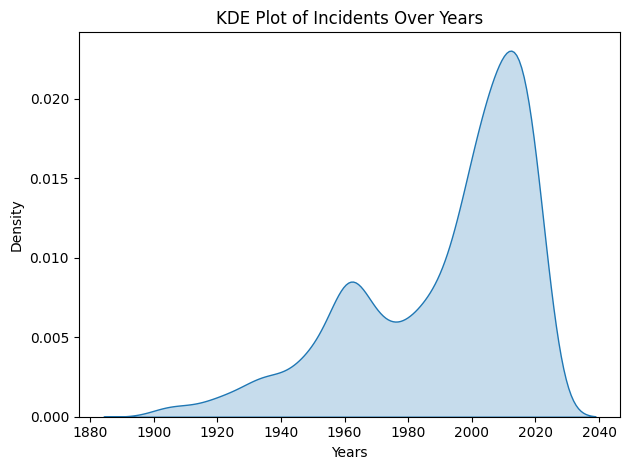

In [48]:
sns.kdeplot(data=shark_df[shark_df['Year'] >= 1900], x='Year', fill=True)
KDE_plot = plt.title('KDE Plot of Incidents Over Years')
plt.xlabel('Years')
plt.ylabel('Density')
plt.tight_layout()
plt.show()

From this graph, there is a clear increase over time of reported shark attacks until 2015. This may be from more humans in the ocean or could be from better reporting and record keeping. After 2015 there is a noticable decline with a sharp decline after 2020. The Covid-19 pandemic could have played a role in this decline.


Kdeplot for shark attacks grouped by fatal y/n and age

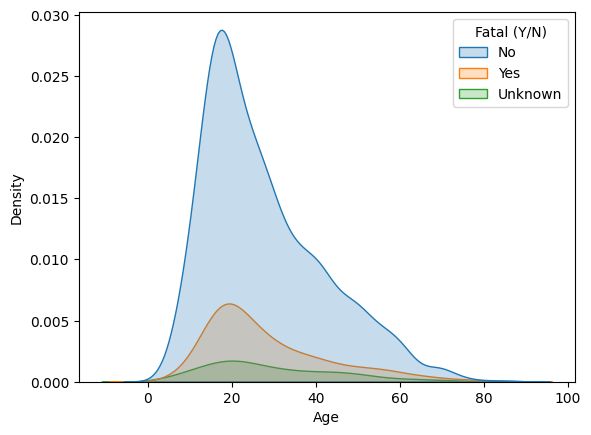

In [49]:
sns.kdeplot(data=shark_df, x='Age', hue='Fatal (Y/N)', fill=True)
plt.show()

The density chart above shows mortality rates by age. This graph allows us to see the largest density of attacks are not fatal.

Count Plot

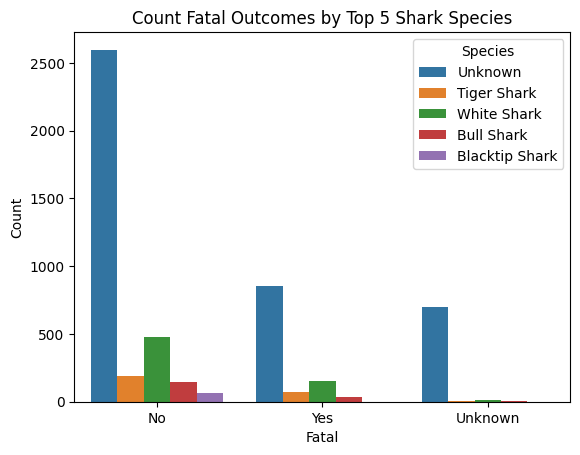

In [50]:
#Get top 5 most frequent species
top_species = shark_df['Species'].value_counts().nlargest(5).index

#Filter the DataFrame to include only those species
filtered_df = combined_df[combined_df['Species'].isin(top_species)]

sns.countplot(data=filtered_df, x='Fatal (Y/N)', hue='Species')
plt.title('Count Fatal Outcomes by Top 5 Shark Species')
plt.xlabel('Fatal')
plt.ylabel('Count')
plt.show()

Unknown is the most common species value, which could indicate quality issues. White Sharks are the most recorded species of shark attacks. They have a high count of fatal attacks.

Box Plot showing Age Distribution of White Shark Attack Victims by Decade

<ipython-input-51-d387c3f33859>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_df['Decade'] = combined_df['Decade'].astype(int)


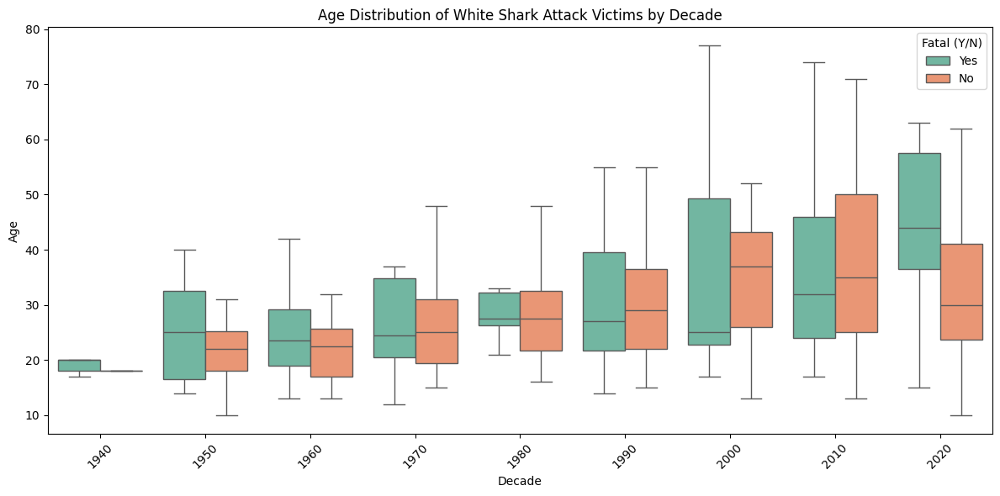

In [51]:
#Drop rows where Decade is NaN before converting to int
combined_df = combined_df[combined_df['Decade'].notna()]

#Make sure decade value are integers
combined_df['Decade'] = combined_df['Decade'].astype(int)

#Filter df to only include rows with species that contain White Shark & age is greater than 0
white_shark_df = combined_df[
    combined_df['Species'].str.contains('White Shark', case=False, na=False) &
    (combined_df['Age'] > 0)
]

#Filter to only include decades after 1930
white_shark_df = white_shark_df[white_shark_df['Decade'] > 1930]


#Create a figure for box plot with specified size
plt.figure(figsize=(12, 6))

#Create box plot
sns.boxplot(data=white_shark_df, x='Decade', y='Age', showfliers=False, hue='Fatal (Y/N)',  palette='Set2')
plt.title('Age Distribution of White Shark Attack Victims by Decade')
plt.xlabel('Decade')
plt.ylabel('Age')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In most decades, the median age for both fatal and non-fatal outcomes is in the 20s and 30s. There is a gradual increase in victim age over time. Age distribution is greater in more recent decades which shows a broader range of victims. Fatal and non fatal age disctributions stays pretty similar throughout the decades.

Violin Plot

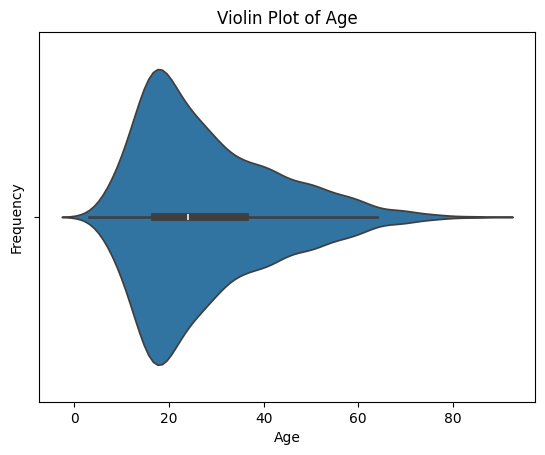

In [52]:
sns.violinplot(shark_df, x='Age')
plt.title('Violin Plot of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

The violin plot above provides a visual of median respreseted by the white dot. The inner dark line is the interquartile range and the thin line is rest of the distribution.

3. Show an example of each of the following two feature plots on Barrios dataset. Use hue, style, and size parameters  as well.  Explain the results of each plot briefly.

Two Feature Plots (Seaborn)

Scatter Plot

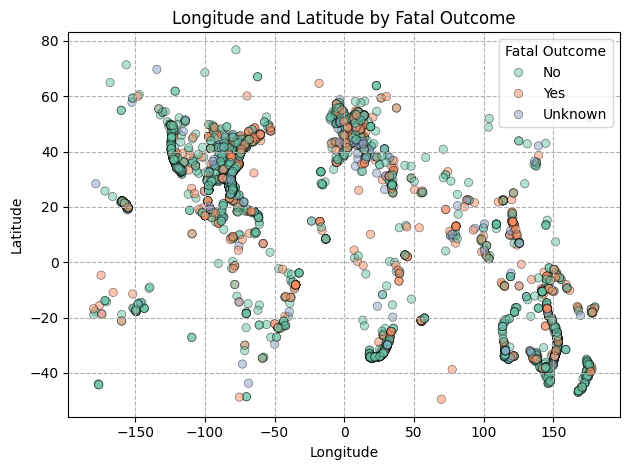

In [53]:
sns.scatterplot(combined_df, x='Lon', y='Lat', hue='Fatal (Y/N)', palette='Set2', alpha=0.5, edgecolor='black', linewidth=0.5)
plt.title('Longitude and Latitude by Fatal Outcome')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, linestyle='--')
plt.legend(title='Fatal Outcome', loc='upper right')
plt.tight_layout()
plt.show()

Scatter plot displays shark attacks based on thier recorded latitude and longitude coordinates. The green dots represent attacks that were not fatal. The red show fatal attacks, and the blue show unknown outcomes. The largest clusters of attacks appear around the coastlines of the US, Australia, and Africa.


Swarm plot of random sample of type of attack (provoked or unprovoked) by age

/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:3399: UserWarning: 8.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


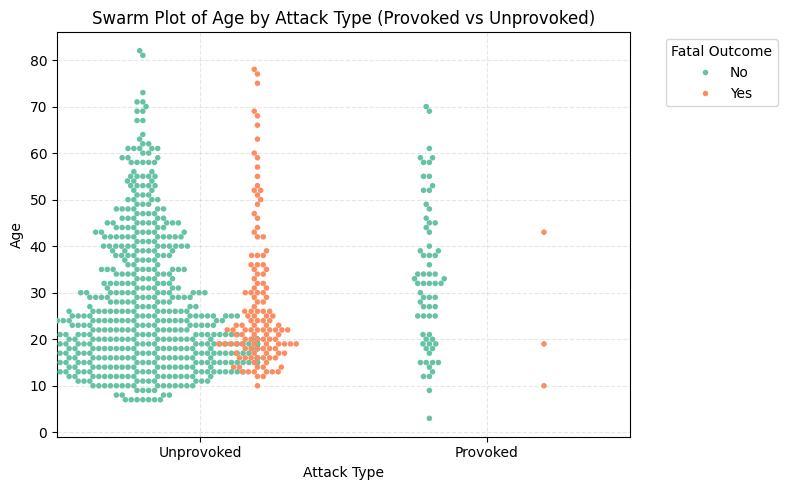

In [54]:
#Filter for valid 'Type' and 'Age'
filtered_df = combined_df[combined_df['Type'].isin(['Provoked', 'Unprovoked']) & combined_df['Age'].notna() & (combined_df['Age'] > 0)]

#Choose random sample to reduce visual clutter and allow swarmplot to process properly
sample_df = filtered_df.sample(n=800, random_state=42)

#Plot data
plt.figure(figsize=(8, 5))
sns.swarmplot(data=sample_df, x='Type', y='Age', hue='Fatal (Y/N)', palette='Set2', dodge=True, size=4)

plt.title('Swarm Plot of Age by Attack Type (Provoked vs Unprovoked)')
plt.xlabel('Attack Type')
plt.ylabel('Age')
plt.legend(title='Fatal Outcome', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()


The SwarmPlot depicts the age distribution of those involved in an attack that was either provoked or unprovoked. The green dots indicate that the attack was not fatal, the red show fatal attacks, while the blue are unknown. The swarm plot was run with a random sample as this dataset was too large for a swarm plot.

Strip Plot

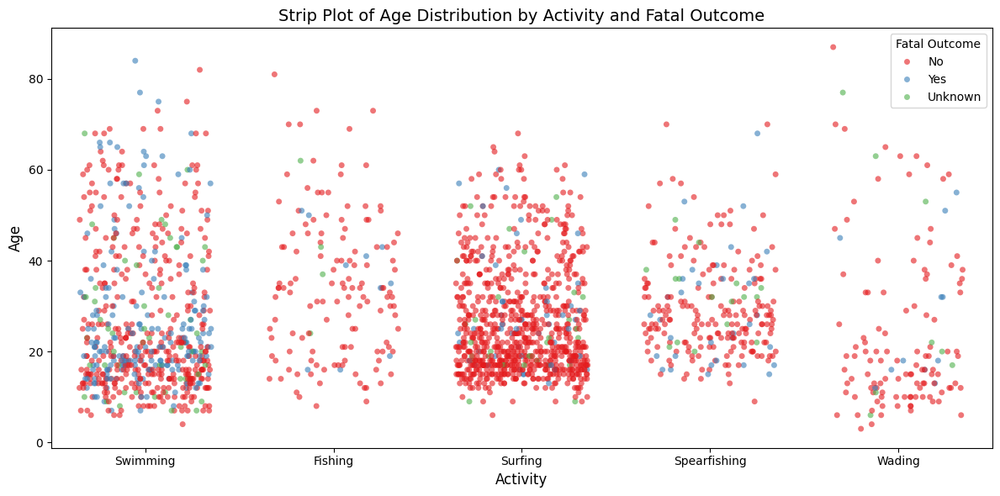

In [55]:
#Age vs. Activity
plt.figure(figsize=(12, 6))

#top 5 activities
top_activities = shark_df['Activity'].value_counts().nlargest(5).index

sns.stripplot(data=shark_df[shark_df['Activity'].isin(top_activities) & (shark_df['Age'] > 0)], x='Activity', y='Age', hue='Fatal (Y/N)', palette='Set1', alpha=0.6, jitter=0.35, size=5)
plt.title('Strip Plot of Age Distribution by Activity and Fatal Outcome', fontsize=14)
plt.xlabel('Activity', fontsize=12)
plt.ylabel('Age', fontsize=12)
plt.legend(title='Fatal Outcome', loc='upper right')
plt.tight_layout()
plt.show()


From this visualization, we can see most incidents occur amoung young adults, with a large portion between age 15 to 35. This is true across all five activities. Based on this we can tell younger age groups are more active in the ocean and participate in more risk-prone activities. Fatalies that we see in blue are less common. Non-fatal incidents make up most of the incidents, which we see the most in Swimming and Surfing. Unknown fatal outcomes are scattered and relatively few which leads us to believe there is good record keeping in attacks.

Show attack counts on map

In [56]:
import folium
from folium.plugins import MarkerCluster

#Create a base map centered globally
map_center = [0, 0]
shark_map = folium.Map(location=map_center, zoom_start=2)

#Use marker clustering for better performance
marker_cluster = MarkerCluster().add_to(shark_map)

#Loop through the combined_df to plot each point
for _, row in combined_df.dropna(subset=['Lat', 'Lon']).iterrows():
    lat = row['Lat']
    lon = row['Lon']
    fatal = row['Fatal (Y/N)']

    #Color by outcome
    color = {'Yes': 'red', 'No': 'green', 'Unknown': 'blue'}.get(fatal, 'gray')

    folium.CircleMarker(location=[lat, lon], radius=3, color=color, fill=True, fill_opacity=0.6, popup=f"Fatal: {fatal}").add_to(marker_cluster)

#Display map
shark_map

# Exploratory Data Analysis

Step 1: Understand the data


Shape, Info, Numerical and Categorical Features for shark df

In [57]:
#shape
print("shark_df shape:", shark_df.shape)

#Column types and non-null counts
print(shark_df.info())

#List of numerical and categorical features
numerical_cols = shark_df.select_dtypes(include='number').columns.tolist()
categorical_cols = shark_df.select_dtypes(exclude='number').columns.tolist()

print("Numerical:", numerical_cols)
print("Categorical:", categorical_cols)

shark_df shape: (3577, 17)
<class 'pandas.core.frame.DataFrame'>
Index: 3577 entries, 0 to 6867
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            3577 non-null   datetime64[ns]
 1   Year            3577 non-null   int64         
 2   Decade          3577 non-null   int64         
 3   Type            3577 non-null   object        
 4   Country         3575 non-null   object        
 5   Area            3508 non-null   object        
 6   Location        3577 non-null   object        
 7   Activity        3577 non-null   object        
 8   Name            3577 non-null   object        
 9   Sex             3577 non-null   object        
 10  Age             3577 non-null   int64         
 11  Injury          3571 non-null   object        
 12  Fatal (Y/N)     3577 non-null   object        
 13  Time            2560 non-null   object        
 14  Species         3577 non-null   ob

Shape, Info, Numerical and Categorical Features for location df

In [58]:
#Shape
print("location_df shape:",location_df.shape)


#Column types and non-null counts
print(location_df.info())

#List of numerical and categorical features
numerical_cols = location_df.select_dtypes(include='number').columns.tolist()
categorical_cols = location_df.select_dtypes(exclude='number').columns.tolist()

print("Numerical:", numerical_cols)
print("Categorical:", categorical_cols)



location_df shape: (5639, 8)
<class 'pandas.core.frame.DataFrame'>
Index: 5639 entries, 0 to 6888
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Original_Location  5639 non-null   object 
 1   Lat                5639 non-null   float64
 2   Lon                5639 non-null   float64
 3   City               4741 non-null   object 
 4   County             4403 non-null   object 
 5   State              5639 non-null   object 
 6   State_Code         4836 non-null   object 
 7   Country_Code       5639 non-null   object 
dtypes: float64(2), object(6)
memory usage: 525.5+ KB
None
Numerical: ['Lat', 'Lon']
Categorical: ['Original_Location', 'City', 'County', 'State', 'State_Code', 'Country_Code']


Shape, Info, Numerical and Categorical Features for combined df

In [59]:
#Shape
print("combined_df shape:",combined_df.shape)

#Column types and non-null counts
print(combined_df.info())

#List of numerical and categorical features
numerical_cols = combined_df.select_dtypes(include='number').columns.tolist()
categorical_cols = combined_df.select_dtypes(exclude='number').columns.tolist()

print("Numerical:", numerical_cols)
print("Categorical:", categorical_cols)

combined_df shape: (6075, 25)
<class 'pandas.core.frame.DataFrame'>
Index: 6075 entries, 0 to 6882
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               6075 non-null   datetime64[ns]
 1   Year               6075 non-null   float64       
 2   Decade             6075 non-null   int64         
 3   Type               6075 non-null   object        
 4   Country            6065 non-null   object        
 5   Area               5863 non-null   object        
 6   Location           6075 non-null   object        
 7   Activity           6075 non-null   object        
 8   Name               6075 non-null   object        
 9   Sex                6075 non-null   object        
 10  Age                6075 non-null   float64       
 11  Injury             6051 non-null   object        
 12  Fatal (Y/N)        6075 non-null   object        
 13  Time               3267 non-null   obj

Step 2: Identify relationships between features

Correlation matrix

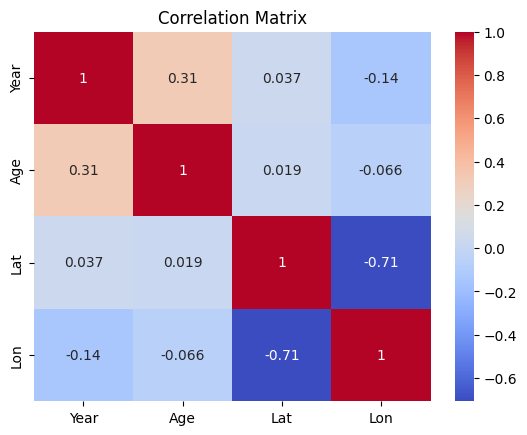

In [60]:
#Drop redundant columns
columns_to_drop = ['Age_Scaled', 'Age_Normalized', 'Decade']
combined_df = combined_df.drop(columns=[col for col in columns_to_drop if col in combined_df.columns])

#Update the list of numerical columns after dropping them
numerical_cols = combined_df.select_dtypes(include='number').columns.tolist()

#Correlation matrix for numerical columns
correlation_matrix = combined_df[numerical_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

Year and Age_Scaled have w moderate correlation. Lat and Lon have a strong negative corrrelation which means when locations are more north (higher Lat), they tend to be further west (lower Lon). Lat and Lon vs Year and Age_Scaled almost have no correlation which lets us know there are no strong trends there.

Step 3: Describe the shape of data

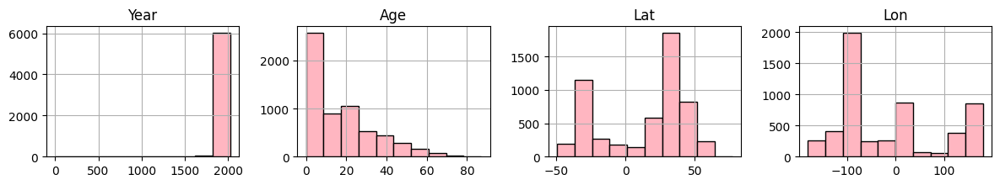

In [61]:
# Drop the 'Date' column for plotting
df_exclude = combined_df.drop(columns=['Date'])

#Set figure spacing and layout
df_exclude.hist(layout=(4, 4), figsize=(12, 8), color='lightpink', edgecolor='black')
plt.tight_layout(pad=1.25)
plt.show()

Year shape is right or positively skewed. Age is also right skewed. Lat us multimodel but is not symmetrical. Lon is also multimodel.

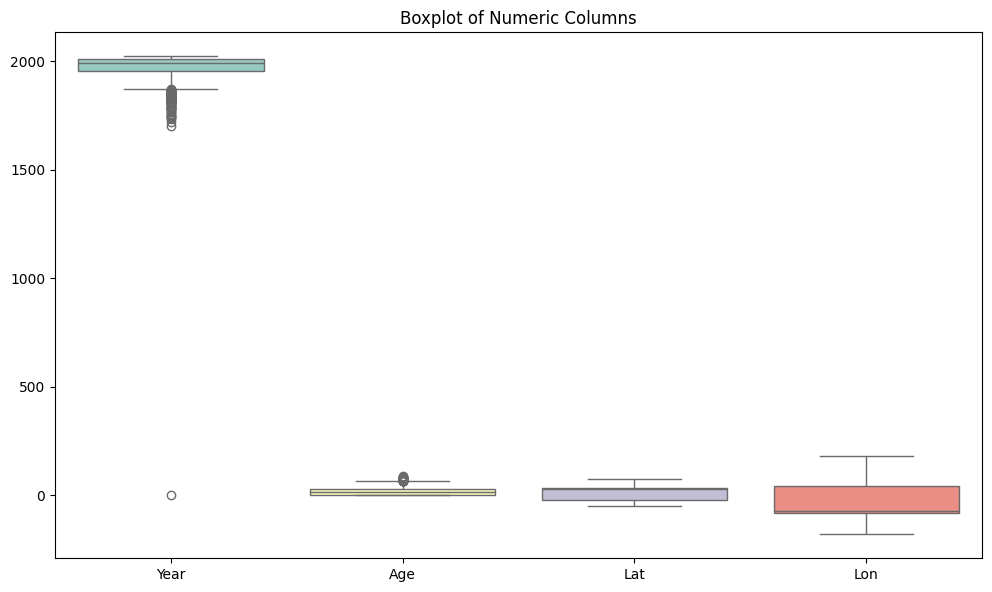

In [62]:
#Plot boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_exclude, palette='Set3')
plt.title("Boxplot of Numeric Columns")
plt.tight_layout(pad=1.0)
plt.show()

Year is left skewed, meaning attacks are most recent. Age is right skewed, meaning younger people are more often affected. Lat and Lon are more symmetrical.

Step 4: Detect outliers and missing data

Idenitfy Outliers in numeric columns

In [63]:
#Select numeric columns
numeric_df = combined_df.select_dtypes(include='number')

#Use IQR to count outliers per column
outlier_counts = {}

#Detect outliers in numeric columns by finding the 1st, 3rd, and interquartiles
for col in numeric_df.columns:
    # Calculate IQR for each column
    Q1 = numeric_df[col].quantile(0.25)
    Q3 = numeric_df[col].quantile(0.75)
    IQR = Q3 - Q1

    #Define outlier bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    #Detect outliers
    outliers = ((numeric_df[col] < lower_bound) | (numeric_df[col] > upper_bound)).sum()
    outlier_counts[col] = outliers

#Print results
for col, count in outlier_counts.items():
    print(f"{col}: {count} outliers")


Year: 176 outliers
Age: 55 outliers
Lat: 0 outliers
Lon: 0 outliers


The age outliers detected above were all elderly victims. This indicates that the majority of victims are of younger age. Interestingly, no young victims such children were detected as outliers.

4. Summarize the dataset using the following methods.

# Dataset summary functions

In [64]:
combined_df.shape

(6075, 22)

Returns the df dimensions which displays as (number of instances, number of features)

In [65]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6075 entries, 0 to 6882
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               6075 non-null   datetime64[ns]
 1   Year               6075 non-null   float64       
 2   Type               6075 non-null   object        
 3   Country            6065 non-null   object        
 4   Area               5863 non-null   object        
 5   Location           6075 non-null   object        
 6   Activity           6075 non-null   object        
 7   Name               6075 non-null   object        
 8   Sex                6075 non-null   object        
 9   Age                6075 non-null   float64       
 10  Injury             6051 non-null   object        
 11  Fatal (Y/N)        6075 non-null   object        
 12  Time               3267 non-null   object        
 13  Species            6075 non-null   object        
 14  Original_Loca

From combined_df.info we can see:

* dataset size - 6306 rows and 23 columns
* we have both categorical and object columns
* non-null count shows there is some missing data
* name appears twice
* 1.2 MB for memory usages so its easy to process

In [66]:
combined_df.describe(include='all')

,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,...,Time,Species,Original_Location,Lat,Lon,City,County,State,State_Code,Country_Code
count,6075,6075.000000,6075,6065,5863,6075,6075,6075,6075,6075.000000,...,3267,6075,5427,5427.000000,5427.000000,4566,4245,5427,4684,5427
unique,NaN,NaN,6,156,679,4253,1271,5068,3,NaN,...,387,206,3699,NaN,NaN,1821,1097,538,200,129
top,NaN,NaN,Unprovoked,USA,Florida,"New Smyrna Beach, Volusia County",Surfing,Male,M,NaN,...,Afternoon,Unknown,"New Smyrna Beach, Volusia County",NaN,NaN,New Smyrna Beach,Volusia County,Florida,Fl,Us
freq,NaN,NaN,4515,2412,1141,191,1094,556,4880,NaN,...,204,3937,191,NaN,NaN,226,352,1073,1073,2508
mean,1975-09-02 17:28:24.888888896,1974.875391,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.434074,...,NaN,NaN,NaN,13.065138,-12.216440,NaN,NaN,NaN,NaN,NaN
min,1703-03-26 00:00:00,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,...,NaN,NaN,NaN,-49.494775,-179.998120,NaN,NaN,NaN,NaN,NaN
25%,1954-09-18 00:00:00,1954.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,...,NaN,NaN,NaN,-23.707410,-81.022833,NaN,NaN,NaN,NaN,NaN
50%,1990-08-19 00:00:00,1990.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.000000,...,NaN,NaN,NaN,27.275596,-70.326837,NaN,NaN,NaN,NaN,NaN
75%,2010-02-12 00:00:00,2010.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.000000,...,NaN,NaN,NaN,34.765215,43.681258,NaN,NaN,NaN,NaN,NaN
max,2023-08-16 00:00:00,2023.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,87.000000,...,NaN,NaN,NaN,76.804658,179.989880,NaN,NaN,NaN,NaN,NaN


# Dealing with Outliers



6. Try to find outliers in the dataset such as the following, show examples, and show how you are cleaning them.

In [67]:
#Make a copy to preserve original df
df_cleaned = combined_df.copy()

for col in numeric_df.columns:
    Q1 = df_cleaned[col].quantile(0.25)
    Q3 = df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # Replace outliers with NaN
    df_cleaned.loc[(df_cleaned[col] < lower) | (df_cleaned[col] > upper), col] = np.nan

#Recalculate outlier counts AFTER cleaning
new_outlier_counts = {}

for col in df_cleaned.select_dtypes(include='number'):
    Q1 = df_cleaned[col].quantile(0.25)
    Q3 = df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    count = ((df_cleaned[col] < lower) | (df_cleaned[col] > upper)).sum()
    new_outlier_counts[col] = count

In [68]:
#Print results
for col, count in new_outlier_counts.items():
    print(f"{col}: {count} outliers (after cleaning)")

Year: 50 outliers (after cleaning)
Age: 6 outliers (after cleaning)
Lat: 0 outliers (after cleaning)
Lon: 0 outliers (after cleaning)


# Project - Progress Report #2 - Regression AND Progress Report #3 - Evaluating Model Performance


##Simple Linear Regression


Predict whether attacks are becoming increasingly fatal using simple linear regression by calculating the number of fatal shark attacks per decade.

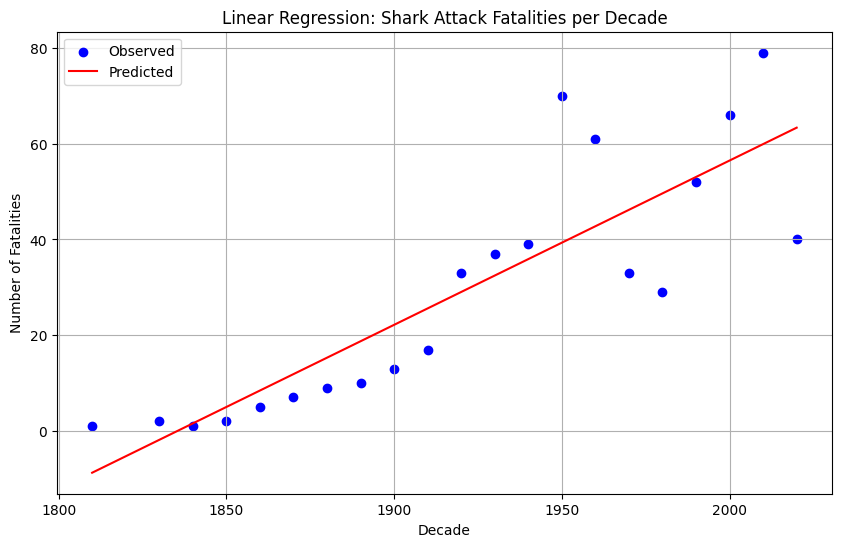

In [69]:
#Count fatal attacks by decade
fatal_by_decade = (shark_df[shark_df['Fatal (Y/N)'] == 'Yes'].groupby('Decade').size().reset_index(name='Fatality_Count'))

#Predictor and response
X = fatal_by_decade[['Decade']] #Predictor
y = fatal_by_decade['Fatality_Count']

#Initialize and fit the Linear Regression Model
model = LinearRegression()
model.fit(X, y)

#Predict using the model
predictions = model.predict(X)

#Plot observed vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='blue', label='Observed')
plt.plot(X, predictions, color='red', label='Predicted')
plt.xlabel('Decade')
plt.ylabel('Number of Fatalities')
plt.title('Linear Regression: Shark Attack Fatalities per Decade')
plt.legend()
plt.grid(True)
plt.show()

This scatter plot visualize the observed number of fatalities per decade. The red line represents the predicted trend line that is produced by the linear regression model. The slope of the line is positive which indicates the amount of fatal attacks per decade is increasing. There are some deviations from the line which occurs when fatalities are higher or lower than predicted.

### Measure the performance of the model and make sure that the model performance is high

Predict whether attacks are becoming increasingly fatal using simple linear regression


In [70]:
#Count fatal attacks by decade
fatal_by_decade = (shark_df[shark_df['Fatal (Y/N)'] == 'Yes'].groupby('Decade').size().reset_index(name='Fatality_Count'))

#Predictor and response
X = fatal_by_decade[['Decade']] #Predictor
y = fatal_by_decade['Fatality_Count']

#Initialize and fit the Linear Regression Model
model = LinearRegression()
model.fit(X, y)

#Predict using the model
predictions = model.predict(X)

#Evaluate model
mse = mean_squared_error(y, predictions)
r2 = r2_score(y, predictions)

#Calculate Adjusted R-squared
n = len(y)          # number of observations
p = X.shape[1]      # number of predictors (1 in this case)
adj_r2 = 1 - ((1 - r2) * (n - 1)) / (n - p - 1)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared: {r2:.4f}")
print(f"Adjusted R-squared: {adj_r2:.4f}")

Mean Squared Error (MSE): 159.43
R-squared: 0.7357
Adjusted R-squared: 0.7218


Shark attacks appear to be more fatal over time. The R^2 of 73.6% indicates that the model has a strong linear relationship of fatalities over time. This could be a result of attacks happening more frequently throughout the decades. Thus, resulting in more deaths.

###Cross Validation of Simple Linear Regression

Predict whether attacks are becoming increasingly fatal using simple linear regression

In [71]:
#Count fatal attacks by decade
fatal_by_decade = (shark_df[shark_df['Fatal (Y/N)'] == 'Yes'].groupby('Decade').size().reset_index(name='Fatality_Count'))

#Predictor and response
X = fatal_by_decade[['Decade']] #Predictor
y = fatal_by_decade['Fatality_Count']

#Initialize and fit the Linear Regression Model
model = LinearRegression()
model.fit(X, y)

#Predict using the model
predictions = model.predict(X)

#Cross-validation setup (5-fold)
kf = KFold(n_splits=5, shuffle=True, random_state=42)

#Perform cross-validation with negative MSE scoring
neg_mse_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error')

#Convert to positive RMSE
rmse_scores = np.sqrt(-neg_mse_scores)

# Print results
print("Cross-validated RMSE scores:", rmse_scores)
print("Mean RMSE:", rmse_scores.mean())

Cross-validated RMSE scores: [10.61153212  7.10199851 18.98450113 15.06757815 17.38482577]
Mean RMSE: 13.830087135204261


A 5-fold cross-validation was used for the simple linear regression due to the size of the dataset. The RMSE scores ranged from 7.1% to 19%. This indicates that there is some variability in the model. The mean RMSE is 13.83 which tells us that the model is off by approximately 14 fatalities per decade.

###Bootstrap of Simple Linear Regression

Apply bootstrap method to the Simple Linear Regression to predict whether attacks are becoming increasingly fatal using simple linear regression.

In [72]:
#Count fatal attacks by decade
fatal_by_decade = (shark_df[shark_df['Fatal (Y/N)'] == 'Yes'].groupby('Decade').size().reset_index(name='Fatality_Count'))

#Predictor and response
X = fatal_by_decade[['Decade']] #Predictor
y = fatal_by_decade['Fatality_Count']

#Initialize and fit the Linear Regression Model
model = LinearRegression()
model.fit(X, y)

#Predict using the model
predictions = model.predict(X)

#Apply Bootstrap
n_iterations = 1000
n_size = int(len(X) * 0.8)
rng = np.random.default_rng(42)

rmse_scores = []

for _ in range(n_iterations):
    #Resample with replacement
    indices = rng.choice(len(X), size=n_size, replace=True)
    X_sample = X.iloc[indices]
    y_sample = y.iloc[indices]

    #Out-of-bag data for testing
    oob_mask = ~X.index.isin(X_sample.index)
    X_oob = X[oob_mask]
    y_oob = y[oob_mask]

    #Skip if no OOB samples
    if len(X_oob) == 0:
        continue

    #Fit and evaluate
    model = LinearRegression()
    model.fit(X_sample, y_sample)
    y_pred = model.predict(X_oob)
    rmse = np.sqrt(mean_squared_error(y_oob, y_pred))
    rmse_scores.append(rmse)

#Analyze bootstrap results
rmse_scores = np.array(rmse_scores)
print(f"Bootstrap Mean RMSE: {rmse_scores.mean():.4f}")
print(f"95% Confidence Interval: [{np.percentile(rmse_scores, 2.5):.4f}, {np.percentile(rmse_scores, 97.5):.4f}]")

Bootstrap Mean RMSE: 14.7343
95% Confidence Interval: [8.4719, 21.7828]


The bootstrap method shows similar results to the 5-fold cross-validation. It determines that for every 1000 samples the model fails to predict 14.7 fatalities. The 95% confidence interval ranges between 8.47 and 21.78 indicating moderate error and some variability in the models performance.

##Multiple Linear Regression Model.


###Multiple Linear Regression #1

Predict attacks by Decade using Fatality, Type, Activity, and Sex.

=== Regression Loss Functions ===
Mean Squared Error (MSE): 234.70
Root Mean Squared Error (RMSE): 15.32
Mean Absolute Error (MAE): 8.99
R-squared: 0.9954
Adjusted R-squared: 0.9945


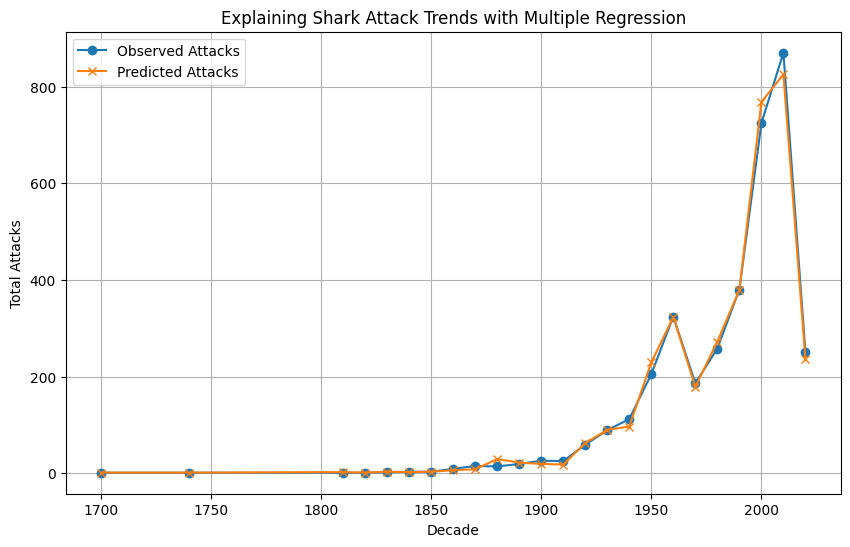

In [73]:
#Aggregate total attacks per decade
attacks_by_decade = shark_df.groupby('Decade').size().reset_index(name='Total_Attacks')

#Add predictors
#Number of fatal attacks per decade (Fatality)
fatal_by_decade = shark_df[shark_df['Fatal (Y/N)'] == 'Yes'].groupby('Decade').size().reset_index(name='Fatal_Attacks')
attacks_by_decade = pd.merge(attacks_by_decade, fatal_by_decade, on='Decade', how='left').fillna(0)

#Number of provoked attacks (Type)
provoked = shark_df[shark_df['Type'] == 'Provoked'].groupby('Decade').size().reset_index(name='Provoked_Count')
attacks_by_decade = pd.merge(attacks_by_decade, provoked, on='Decade', how='left').fillna(0)

#Number of surfing-related attacks (Activity)
surfing = shark_df[shark_df['Activity'].str.contains('Surf', case=False, na=False)]
surf_by_decade = surfing.groupby('Decade').size().reset_index(name='Surf_Attacks')
attacks_by_decade = pd.merge(attacks_by_decade, surf_by_decade, on='Decade', how='left').fillna(0)

#Proportion of male victims (Sex)
sex_counts = shark_df[shark_df['Sex'].isin(['M', 'F'])].groupby(['Decade', 'Sex']).size().unstack(fill_value=0)
#Fill in missing 'M' or 'F' if they are not present
sex_counts['M'] = sex_counts.get('M', 0)
sex_counts['F'] = sex_counts.get('F', 0)

#Calculate proportion safely
sex_counts['Prop_Male'] = sex_counts['M'] / (sex_counts['M'] + sex_counts['F'])
sex_counts['Prop_Male'] = sex_counts['M'] / (sex_counts['M'] + sex_counts['F'])
attacks_by_decade = pd.merge(attacks_by_decade, sex_counts[['Prop_Male']], on='Decade', how='left').fillna(0)

#Define predictors and response
X = attacks_by_decade[['Fatal_Attacks', 'Provoked_Count', 'Surf_Attacks', 'Prop_Male']]
y = attacks_by_decade['Total_Attacks']

#Fit multiple linear regression
model = LinearRegression()
model.fit(X, y)
predictions = model.predict(X)

#Loss function metrics
mse = mean_squared_error(y, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y, predictions)

#Set-up R-squared
r_squared = r2_score(y, predictions)

#Adjusted R-squared
n = X.shape[0]  # number of observations
p = X.shape[1]  # number of predictors
adjusted_r_squared = 1 - (1 - r_squared) * (n - 1) / (n - p - 1)

#Print results
print("=== Regression Loss Functions ===")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"R-squared: {r_squared:.4f}")
print(f"Adjusted R-squared: {adjusted_r_squared:.4f}")

#Plot observed vs. predicted total attacks
plt.figure(figsize=(10, 6))
plt.plot(attacks_by_decade['Decade'], y, marker='o', label='Observed Attacks')
plt.plot(attacks_by_decade['Decade'], predictions, marker='x', label='Predicted Attacks')
plt.xlabel('Decade')
plt.ylabel('Total Attacks')
plt.title('Explaining Shark Attack Trends with Multiple Regression')
plt.legend()
plt.grid(True)
plt.show()

This model shows strong predictive performance with an R-squared of 98.04% and an adjusted R-squared of 97.63%. This indicates that the predictors explain roughly 98% of the variance in shark attack counts per decade. The RMSE and MAE tells us that the prediction errors range from 20-32 attacks per decade.

####Cross-Validation on Multiple Regression #1

Predict the total number of shark attacks per decade based on multiple features, using a linear regression model combined with cross-validation.

In [74]:
#Define predictors and response
X = attacks_by_decade[['Fatal_Attacks', 'Provoked_Count', 'Surf_Attacks', 'Prop_Male']]
y = attacks_by_decade['Total_Attacks']

#Initialize the linear regression model
model = LinearRegression()

#Set up K-Fold cross-validation (5 folds in this example)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

#Run cross-validation using negative mean squared error
mse_scores = cross_val_score(model, X, y, cv=cv, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(-mse_scores)  # Convert to positive RMSE


print("=== Cross-Validation (5-Fold) ===")
print("RMSE Scores:", rmse_scores)
print("Mean RMSE:", rmse_scores.mean())
print("Standard Deviation of RMSE:", rmse_scores.std())

=== Cross-Validation (5-Fold) ===
RMSE Scores: [18.50024672 36.18428583 10.11556834 54.61907967  8.86066855]
Mean RMSE: 25.655969822816587
Standard Deviation of RMSE: 17.46137317551901


The 5-fold cross-validation produced an average RMSE of 33.84, indicating that the model's predictions were off by about 34 attacks on average. However, the high standard deviation (24.74) suggests that performance varied significantly across different data splits this likely occured due to potential sensitivity to specific decades.

####Bootstrap - Multiple Regression #1

Assess the stability and variability of a linear regression model's performance by applying the bootstrap resampling technique.

In [75]:
#Parameters for bootstrap
n_iterations = 1000
rng = np.random.RandomState(42)  # for reproducibility
rmse_scores = []

#Bootstrap loop
for _ in range(n_iterations):
    #Resample the data with replacement
    X_resampled, y_resampled = resample(X, y, replace=True, random_state=rng)

    #Fit the model on the resampled data
    model = LinearRegression()
    model.fit(X_resampled, y_resampled)

    #Predict on the same resampled set (in-sample evaluation)
    y_pred = model.predict(X_resampled)

    #Compute RMSE
    mse = mean_squared_error(y_resampled, y_pred)
    rmse = np.sqrt(mse)
    rmse_scores.append(rmse)

#Convert to array for analysis
rmse_scores = np.array(rmse_scores)

print("=== Bootstrap Evaluation ===")
print(f"Mean RMSE: {rmse_scores.mean():.2f}")
print(f"RMSE Standard Deviation: {rmse_scores.std():.2f}")

=== Bootstrap Evaluation ===
Mean RMSE: 11.21
RMSE Standard Deviation: 4.93


The bootstrap method has an RMSE of 26.6, meaning that the model fails to predict approximatley 26.6 attacks. There is a deviation of 8.71 across the bootstrap samples.

3D scatter plot of Fatalities by Decade

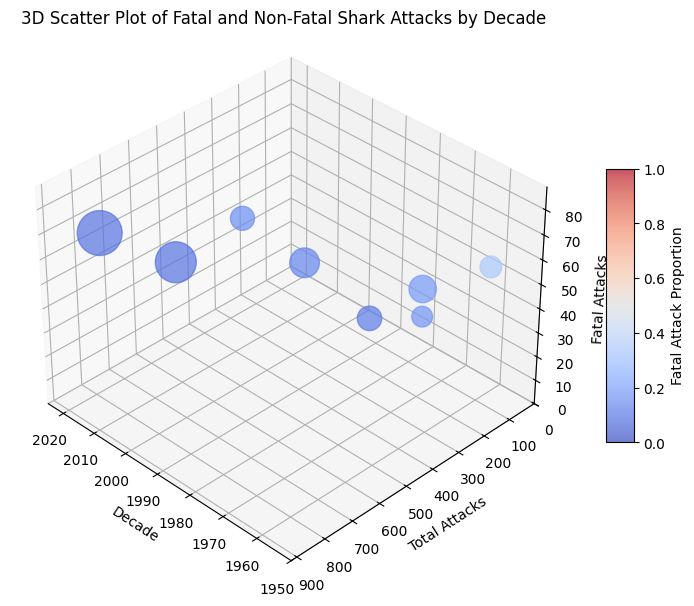

In [76]:
#Group the data by decade and count fatal attacks
attack_counts = (shark_df.groupby(['Decade', 'Fatal (Y/N)']).size().unstack(fill_value=0).reset_index())

#Correct column name on structure
attack_counts.columns = ['Decade', 'Non-Fatal', 'Unknown', 'Fatal']

#Filter the data to only include decades from 1950 to 2025
attack_counts = attack_counts[(attack_counts['Decade'] >= 1950) & (attack_counts['Decade'] <= 2025)]

#Calculate Total Attacks and Fatal Proportion
attack_counts['Total_Attacks'] = attack_counts['Fatal'] + attack_counts['Non-Fatal'] + attack_counts['Unknown']
attack_counts['Fatal_Proportion'] = attack_counts['Fatal'] / attack_counts['Total_Attacks']

#Set up a figure
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

#Apply colormap
cmap = plt.cm.coolwarm
norm = plt.Normalize(vmin=0, vmax=1)

#Plot the points on 3D scatter plot
scatter = ax.scatter(attack_counts['Decade'], attack_counts['Total_Attacks'], attack_counts['Fatal'], c=attack_counts['Fatal_Proportion'], cmap=cmap, norm=norm, s=attack_counts['Total_Attacks'] * 1.2, alpha=0.7)

#Add a color bar to represent the proportion of fatalities
cbar = fig.colorbar(scatter, ax=ax, shrink=0.5, aspect=10)
cbar.set_label('Fatal Attack Proportion')

#Axes labels
ax.set_xlabel('Decade')
ax.set_ylabel('Total Attacks')
ax.set_zlabel('Fatal Attacks')


#Set axis limits
ax.set_xlim(1950, 2025)
ax.set_ylim(0, attack_counts['Total_Attacks'].max() + 50)
ax.set_zlim(0, attack_counts['Fatal'].max() + 10)

#Set the view angle
ax.view_init(elev=35, azim=135)

#Show the plot
plt.title('3D Scatter Plot of Fatal and Non-Fatal Shark Attacks by Decade')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In early decades such as 1950s and 1970s there are large and prominate markers that indicate higher total attack and higher fatalities. In recent decades 2000s to 2020s the markers are larger which shows a higher number of overall attacks. The color gradient is lighter which means that while attacks increased fatal attacks decreased or remained stable. This allows us to conclude while attacks increased over time, the ratio of fatal attacks has either decreased or remained the same.

###Multiple Regression #2

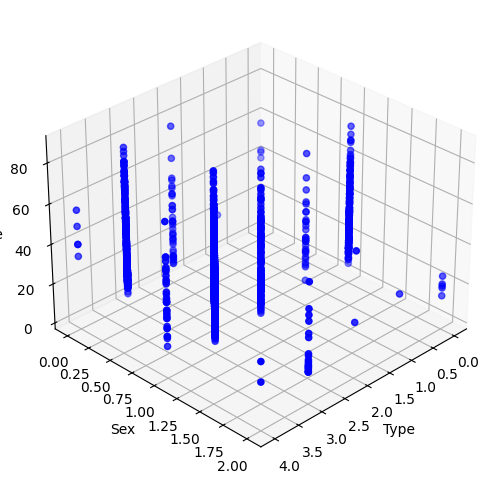

In [77]:
#3D scatter plot of Type, Sex, and Age

#Set up a figure
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

#Encode categorical values
shark_df['Type'] = shark_df['Type'].astype('category').cat.codes
shark_df['Sex'] = shark_df['Sex'].astype('category').cat.codes

#Plot the points on 3D scatter plot
ax.scatter(shark_df['Type'], shark_df['Sex'], shark_df['Age'], color='blue')

#Axes labels
ax.set_xlabel('Type')
ax.set_ylabel('Sex')
ax.set_zlabel('Age')
# Set the view angle
ax.view_init(elev=30, azim=45)

#Show the plot
plt.show()

With Regreesion Plane

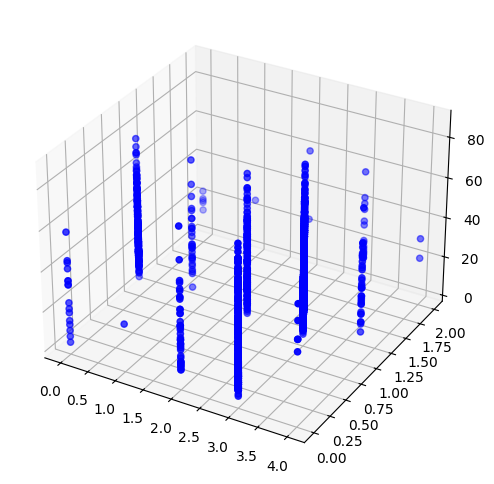

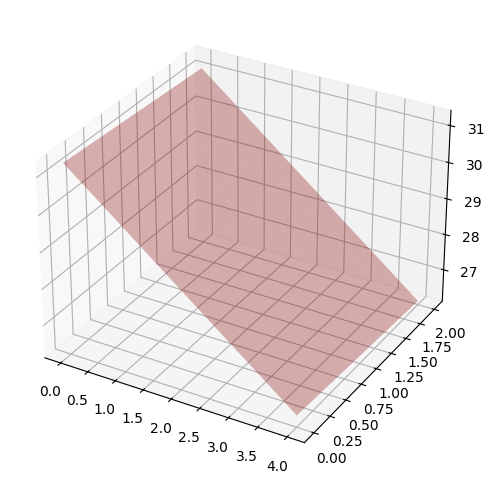

=== Regression Error Metrics ===
Mean Squared Error (MSE): 209.46
Root Mean Squared Error (RMSE): 14.47
Mean Absolute Error (MAE): 11.63
R-squared: 0.0050
Adjusted R-squared: 0.0044


In [78]:
#3D Regression Plane predicting Age from Type and Sex
#Prepare your data
X = shark_df[['Type', 'Sex']]
y = shark_df['Age']

#Fit the regression model
model = LinearRegression()
model.fit(X, y)

#Create plot
type_range=np.linspace(X['Type'].min(), X['Type'].max(), 10)
sex_range=np.linspace(X['Sex'].min(), X['Sex'].max(), 10)
type_mesh, sex_mesh=np.meshgrid(type_range, sex_range)

#Predict age values
input_grid=pd.DataFrame(np.c_[type_mesh.ravel(), sex_mesh.ravel()], columns=['Type', 'Sex'])
age_pred=model.predict(input_grid)
age_mesh=age_pred.reshape(type_mesh.shape)

#plot the points on the graph
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X['Type'], X['Sex'], y, color='blue')


#Plot the regression plane
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(type_mesh, sex_mesh, age_mesh, alpha=0.3, color='red')
plt.show()

#Add axes labels
ax.set_xlabel('Type')
ax.set_ylabel('Sex')
ax.set_zlabel('Age');

#Predict on the original data
y_pred = model.predict(X)

#Calculate error metrics
mse = mean_squared_error(y, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y, y_pred)

#R-squared
r2 = r2_score(y, y_pred)

#Adjusted R-squared
n = X.shape[0]  # number of observations
p = X.shape[1]  # number of predictors
adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

#Print results
print("=== Regression Error Metrics ===")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"R-squared: {r2:.4f}")
print(f"Adjusted R-squared: {adjusted_r2:.4f}")

A multiple regression model was run to predict victim age based on type of attack and sex of the victim. Although a regression plane was generated and visualized the model indicated that the variables do not have a significant relationship with the target. This is evidenced by the low adjusted R-suared value of .0044. Cross-Validation and Bootstrap were not run on this model. Instead an additional multiple regression model was run to add features and test the outcome. See Multiple Regression #3, below.

###Multiple Regression #3

Multiple Linear Regression to predict Victime Age by Type, Sex, and Activity

Mean Squared Error (MSE): 158.20
Root Mean Squared Error (RMSE): 12.58
Mean Absolute Error (MAE): 9.06
R-squared: 0.2484
Adjusted R-squared: 0.0808


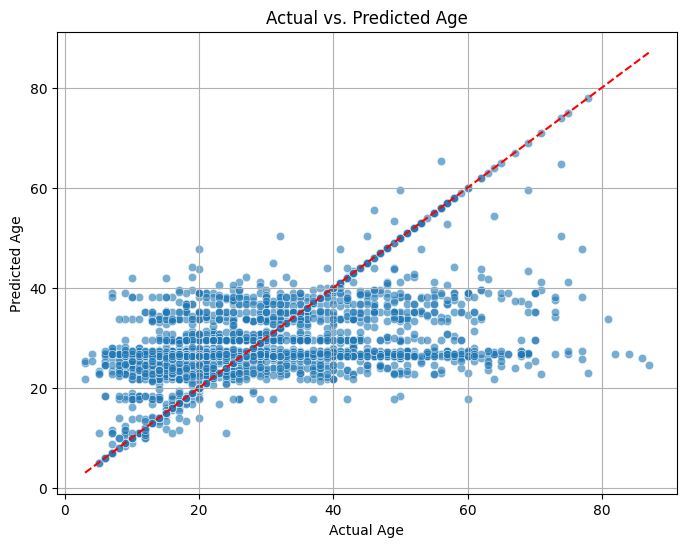

In [79]:
#Filter valid rows
MLR_model_df = shark_df.copy()
MLR_model_df = MLR_model_df.dropna(subset=['Type', 'Sex', 'Activity', 'Age'])

#Target
y = MLR_model_df['Age']

#Predictors (categorical to dummies)
X = pd.get_dummies(MLR_model_df[['Type', 'Sex', 'Activity']], drop_first=True)

#Fit multiple linear regression model
model = LinearRegression()
model.fit(X, y)

#Predict
y_pred = model.predict(X)

#Evaluate the model
mse = mean_squared_error(y, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y, y_pred)
r2 = r2_score(y, y_pred)
n, p = X.shape
adj_r2 = 1 - ((1 - r2) * (n - 1)) / (n - p - 1)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"R-squared: {r2:.4f}")
print(f"Adjusted R-squared: {adj_r2:.4f}")

#Actual vs. Predicted Age Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y, y=y_pred, alpha=0.6)
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--')  # reference line
plt.xlabel('Actual Age')
plt.ylabel('Predicted Age')
plt.title('Actual vs. Predicted Age')
plt.grid(True)
plt.show()

The model indicates that the prediction of Age based on Type, Sex, and Activity has an average error of 9-12 years. The R-squared is low at 24.8% meaning that the variables do not have a strong correlation to Age.

####Cross-Validation of Multiple Regression #3

Perform 5-fold cross-validation of multiple linear regression to predict age of victim.

In [80]:
MLR_model_df = shark_df.copy()
MLR_model_df = MLR_model_df.dropna(subset=['Type', 'Sex', 'Activity', 'Age'])

#Target
y = MLR_model_df['Age']

#Predictors (categorical to dummies)
X = pd.get_dummies(MLR_model_df[['Type', 'Sex', 'Activity']], drop_first=True)

#Fit multiple linear regression model
model = LinearRegression()
model.fit(X, y)

#Predict
y_pred = model.predict(X)

#Evaluate the model
mse = mean_squared_error(y, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y, y_pred)
r2 = r2_score(y, y_pred)
n, p = X.shape
adj_r2 = 1 - ((1 - r2) * (n - 1)) / (n - p - 1)

#Define model
model = LinearRegression()

#Set up 5-fold cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)

#RMSE
neg_mse_scores = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=cv)
rmse_scores = np.sqrt(-neg_mse_scores)

#MAE
mae_scorer = make_scorer(mean_absolute_error)
mae_scores = cross_val_score(model, X, y, scoring=mae_scorer, cv=cv)

#Print results
print("----- Cross-Validation Evaluation (5-Fold) -----")
print(f"CV RMSE Scores: {rmse_scores}")
print(f"Mean CV RMSE: {rmse_scores.mean():.2f}")
print(f"Std Dev CV RMSE: {rmse_scores.std():.2f}")

print(f"\nCV MAE Scores: {mae_scores}")
print(f"Mean CV MAE: {mae_scores.mean():.2f}")
print(f"Std Dev CV MAE: {mae_scores.std():.2f}")

----- Cross-Validation Evaluation (5-Fold) -----
CV RMSE Scores: [15.90855317 13.48867371 14.64547303 15.03605054 15.16532648]
Mean CV RMSE: 14.85
Std Dev CV RMSE: 0.79

CV MAE Scores: [11.93894151 10.90330707 11.40404238 11.42923918 11.55000846]
Mean CV MAE: 11.45
Std Dev CV MAE: 0.33


A 5-fold cross-validation was performed on the multiiple regression due to the size of the dataset. The 5-fold cross validation RMSE and MAE scores are higher than the test/train model. This indicates that the model performs slightly worse across multiple samples. The standard deviations for RMSE and MAE are low at 0.79 and .33, respectively. This indicated that the model is showing consistent performance.  

####Bootstrap Method - Multiple Linear Regression #3

In [92]:
n_iterations = 1000
n_size = int(len(X) * 0.8)
rng = np.random.default_rng(seed=42)

rmse_scores = []
mae_scores = []

for i in range(n_iterations):
    indices = rng.choice(X.index, size=n_size, replace=True)
    X_sample = X.loc[indices]
    y_sample = y.loc[indices]

    model = LinearRegression()
    model.fit(X_sample, y_sample)

    y_pred_sample = model.predict(X_sample)
    rmse = np.sqrt(mean_squared_error(y_sample, y_pred_sample))
    mae = mean_absolute_error(y_sample, y_pred_sample)

    rmse_scores.append(rmse)
    mae_scores.append(mae)

# Results
rmse_scores = np.array(rmse_scores)
mae_scores = np.array(mae_scores)

print("\n----- Bootstrap Evaluation (Resampled Train Error) -----")
print(f"Bootstrap RMSE Mean: {rmse_scores.mean():.2f}")
print(f"Bootstrap RMSE Std Dev: {rmse_scores.std():.2f}")
print(f"Bootstrap MAE Mean: {mae_scores.mean():.2f}")
print(f"Bootstrap MAE Std Dev: {mae_scores.std():.2f}")


----- Bootstrap Evaluation (Resampled Train Error) -----
Bootstrap RMSE Mean: 0.79
Bootstrap RMSE Std Dev: 0.01
Bootstrap MAE Mean: 0.67
Bootstrap MAE Std Dev: 0.01


The bootstrap method performed similar to the cross-validation method. Both indicate the model has moderate prediction errors. The average deviations range from 11-15 years. The standard deviations for RMSE and MAE are low, indicating a stable model. However, the predictors may not be good features for predicting age of a victim.

## Logistic Regression Model #1


In [82]:
print(combined_df.columns.tolist())

['Date', 'Year', 'Type', 'Country', 'Area', 'Location', 'Activity', 'Name', 'Sex', 'Age', 'Injury', 'Fatal (Y/N)', 'Time', 'Species', 'Original_Location', 'Lat', 'Lon', 'City', 'County', 'State', 'State_Code', 'Country_Code']


Accuracy: 0.8216939078751857
Classification Report:
               precision    recall  f1-score   support

           0       0.82      1.00      0.90       552
           1       1.00      0.01      0.02       121

    accuracy                           0.82       673
   macro avg       0.91      0.50      0.46       673
weighted avg       0.85      0.82      0.74       673

Confusion Matrix:
 [[552   0]
 [120   1]]


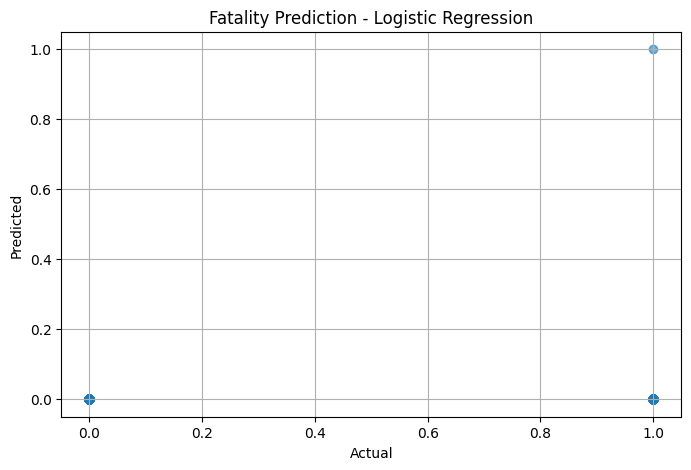

In [83]:
#Simple Logistic Regression
#Predict Fatal Attacks using Type (provoked or unprovoked), Sex, and Activity

#Filter valid rows
model_df = shark_df[shark_df['Fatal (Y/N)'].isin(['Yes', 'No'])].copy()

#Drop missing values from predictors
model_df = model_df.dropna(subset=['Type', 'Sex', 'Activity'])

#Map target variable
model_df['Fatal_Binary'] = model_df['Fatal (Y/N)'].map({'Yes': 1, 'No': 0})

#Simplify uncommon activities
top_activities = model_df['Activity'].value_counts().nlargest(10).index
model_df['Activity'] = model_df['Activity'].apply(lambda x: x if x in top_activities else 'Other')

#Encode predictors
X = pd.get_dummies(model_df[['Type', 'Sex', 'Activity']], drop_first=True)
y = model_df['Fatal_Binary']

#Split and train model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

#Evaluate the model
y_pred = model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

#Visualize the model
plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred, alpha=0.6)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Fatality Prediction - Logistic Regression")
plt.grid(True)
plt.show()

The accuracy of the model is 82%. While this appears to be an accurate model it is actually imbalanced because of the number of nonfatal cases compared to the fatal ones. This makes the model biased towards predicting nonfatal cases. The recall for fatal (class 1) cases is .01 meaning that the model failed to detect most fatal attacks. Out of the 121 fatal cases analyzed the model only identified 1 accurately. The confusion matrix tells us that 552 instances were correctly predicted as non-fatal and 120 fatal attacks were misclassified as non-fatal.

###Cross Validation of Logistic Regression #1

In [84]:
#Simple Logistic Regression
#Predict Fatal Attacks using Type (provoked or unprovoked), Sex, and Activity

#Filter valid rows
model_df = shark_df[shark_df['Fatal (Y/N)'].isin(['Yes', 'No'])].copy()

#Drop missing values from predictors
model_df = model_df.dropna(subset=['Type', 'Sex', 'Activity'])

#Map target variable
model_df['Fatal_Binary'] = model_df['Fatal (Y/N)'].map({'Yes': 1, 'No': 0})

#Simplify uncommon activities
top_activities = model_df['Activity'].value_counts().nlargest(10).index
model_df['Activity'] = model_df['Activity'].apply(lambda x: x if x in top_activities else 'Other')

#Encode predictors
X = pd.get_dummies(model_df[['Type', 'Sex', 'Activity']], drop_first=True)
y = model_df['Fatal_Binary']

#Split and train model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

#Evaluate the Model
y_pred = model.predict(X_test)

#5-Fold Cross-Validation Evaluation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(model, X, y, cv=skf, scoring='accuracy')

print("\n=== Cross-Validation Evaluation ===")
print("Cross-validated Accuracy Scores:", cv_scores)
print("Mean Accuracy:", cv_scores.mean())


=== Cross-Validation Evaluation ===
Cross-validated Accuracy Scores: [0.81872214 0.81994048 0.81994048 0.81994048 0.81994048]
Mean Accuracy: 0.819696808887002


A stratified 5-fold cross-validation was chosen due to the imbalance and size of the dataset. The cross-validation accuracy scores fall between 81.8% - 81.9% indicating that the model's performance is stable and there is low variance in accuracy. The mean accuracy of 82% indicates that the model is 82% accurate on its' predictions. This falls in-line with the train/test scores.

###Bootstrap Method - Logistic Regression #1

In [93]:
#Apply Bootstrap Method to Logistic Regression from above
#Logistic Regression
#Predict Fatal Attacks using Type (provoked or unprovoked), Sex, and Activity

#Filter valid rows
model_df = shark_df[shark_df['Fatal (Y/N)'].isin(['Yes', 'No'])].copy()

#Drop missing values from predictors
model_df = model_df.dropna(subset=['Type', 'Sex', 'Activity'])

#Map target variable
model_df['Fatal_Binary'] = model_df['Fatal (Y/N)'].map({'Yes': 1, 'No': 0})

#Simplify uncommon activities
top_activities = model_df['Activity'].value_counts().nlargest(10).index
model_df['Activity'] = model_df['Activity'].apply(lambda x: x if x in top_activities else 'Other')

#Encode predictors
X = pd.get_dummies(model_df[['Type', 'Sex', 'Activity']], drop_first=True)
y = model_df['Fatal_Binary']

#Split and train model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

#Evaluate the Model
y_pred = model.predict(X_test)

#Bootstrap
n_iterations = 1000
n_size = int(len(X) * 0.8)
rng = np.random.default_rng(seed=42)  #Random generator for reproducibility
scores = []

for i in range(n_iterations):
    #Sample with replacement
    indices = rng.choice(len(X), size=n_size, replace=True)
    X_sample = X.iloc[indices]
    y_sample = y.iloc[indices]

    #Out-of-bag data (not in bootstrap sample)
    oob_mask = ~X.index.isin(X_sample.index)
    X_oob = X[oob_mask]
    y_oob = y[oob_mask]

    if len(X_oob) == 0:
        continue  #Skip iteration if no OOB samples

    #Train and evaluate
    model = LogisticRegression(max_iter=1000)
    model.fit(X_sample, y_sample)
    y_pred = model.predict(X_oob)
    acc = accuracy_score(y_oob, y_pred)
    scores.append(acc)

#Bootstrap results
scores = np.array(scores)
print(f"Bootstrap Mean Accuracy: {scores.mean():.4f}")
print(f"Bootstrap Accuracy Std Dev: {np.std(scores):.4f}")
print(f"95% Confidence Interval: [{np.percentile(scores, 2.5):.4f}, {np.percentile(scores, 97.5):.4f}]")

Bootstrap Mean Accuracy: 0.8196
Bootstrap Accuracy Std Dev: 0.0074
95% Confidence Interval: [0.8047, 0.8348]


Using 1000 bootstrap samples, the logistic regression model achieved a mean accuracy of 82%. The low standard deviation of .0074 and the 95% confidence interval for accuracy of [80.47%, 83.48%], both indicate that the model's performance is stable and consistently above 80% across random resamples of the data.

## Logistic Regression Model #2

Train/Test Split Accuracy: 0.9727195225916454
Classification Report:
               precision    recall  f1-score   support

           0       0.88      1.00      0.93       228
           1       1.00      0.97      0.98       945

    accuracy                           0.97      1173
   macro avg       0.94      0.98      0.96      1173
weighted avg       0.98      0.97      0.97      1173

Confusion Matrix:
 [[228   0]
 [ 32 913]]


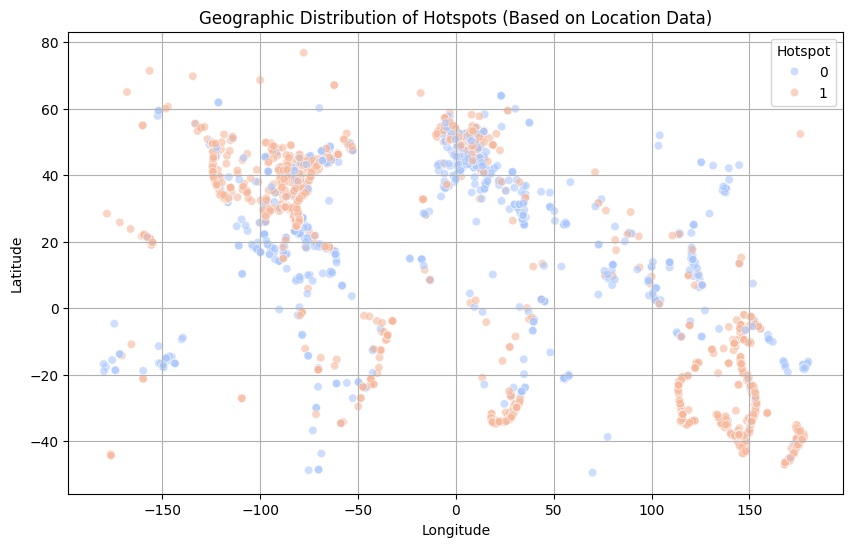

In [85]:
#Create Hotspot Label
attack_counts = combined_df['Country'].value_counts()
hotspot_countries = attack_counts[attack_counts > 100].index.tolist()
combined_df['Hotspot'] = combined_df['Country'].apply(lambda x: 1 if x in hotspot_countries else 0)

#Select categorical geographic features
features = ['Area']

#Drop missing data in selected features and target
LRmodel_df = combined_df.dropna(subset=features + ['Hotspot'])

#One-hot encode categorical features
X = pd.get_dummies(LRmodel_df[features], drop_first=True)
y = LRmodel_df['Hotspot']

#Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

#Train Logistic Regression with balanced class weights ---
model = LogisticRegression(max_iter=1000, class_weight='balanced')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

#Evaluate model on test set
print("Train/Test Split Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

#Filter out rows missing Lat, Lon, or Hotspot
plot_df = combined_df.dropna(subset=['Lat', 'Lon', 'Hotspot'])

#Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=plot_df, x='Lon', y='Lat', hue='Hotspot', palette='coolwarm', alpha=0.6)
plt.title('Geographic Distribution of Hotspots (Based on Location Data)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Hotspot')
plt.grid(True)
plt.show()

The logistic regression used to identify potential hotspots for attacks achieved high accuracy results of 97.3%. The confustion matrix positively identified all non-hotspots with no false positives. When identifiying hotspots, 32 areas were misclassified as non-hotspots.

###Cross-validation of Logistic Regression #2

In [86]:
#Create Hotspot Label
attack_counts = combined_df['Country'].value_counts()
hotspot_countries = attack_counts[attack_counts > 100].index.tolist()
combined_df['Hotspot'] = combined_df['Country'].apply(lambda x: 1 if x in hotspot_countries else 0)

#Select categorical geographic features
features = ['Area']

#Drop missing data in selected features and target
LRmodel_df = combined_df.dropna(subset=features + ['Hotspot'])

#One-hot encode categorical features
X = pd.get_dummies(LRmodel_df[features], drop_first=True)
y = LRmodel_df['Hotspot']

#Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

#Train Logistic Regression with balanced class weights ---
model = LogisticRegression(max_iter=1000, class_weight='balanced')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

#Cross-Validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(model, X, y, cv=cv, scoring='f1')
print("\nCross-Validation F1 Scores:", cv_scores)
print("Mean CV F1 Score:", cv_scores.mean())
print("CV Standard Deviation:", cv_scores.std())


Cross-Validation F1 Scores: [0.97619048 0.9772973  0.98011822 0.97391304 0.98275862]
Mean CV F1 Score: 0.9780555307337172
CV Standard Deviation: 0.003085037203975775


A stratified 5-fold cross-validation was chosen since the classes are imbalanced. The results showed a higher and more stable performance with a mean F1 score of .98 and a standard deviation of .003. This indicates the model is not overfit.

###Bootstrap Method of Logistic Regression #2

In [ ]:
#Prepare data
n_iterations = 1000
bootstrap_accuracies = []

np.random.seed(42)

for i in range(n_iterations):
    # Resample with replacement
    LRmodel_df_sampled = resample(LRmodel_df, replace=True)

    # One-hot encode within bootstrap loop
    X_sampled = pd.get_dummies(LRmodel_df_sampled[features], drop_first=True)
    y_sampled = LRmodel_df_sampled['Hotspot']

    # Skip if either class is missing in the resample (logistic regression needs both classes)
    if len(y_sampled.unique()) < 2:
        continue

    # Split into train/test within the sample
    X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(X_sampled, y_sampled, test_size=0.2, stratify=y_sampled, random_state=42)

    # Train model
    model_b = LogisticRegression(max_iter=1000, class_weight='balanced')
    model_b.fit(X_train_b, y_train_b)

    # Predict and evaluate
    y_pred_b = model_b.predict(X_test_b)
    acc_b = accuracy_score(y_test_b, y_pred_b)
    bootstrap_accuracies.append(acc_b)

# Compute mean and std deviation of accuracy
mean_acc = np.mean(bootstrap_accuracies)
std_acc = np.std(bootstrap_accuracies)

print(f"Bootstrap Accuracy Mean: {mean_acc:.4f}")
print(f"Bootstrap Accuracy Std Dev: {std_acc:.4f}")

The mean accuracy amongst the bootstrap samples is 97.02%, thus resulting in a mean error of 2.98%. This indicates that the model is predicting hotspots with low error rates. The standard deviation of .0057 is low, indicating the model is consistent.

##One-Standard-Error Comparison

Model Coefficients: [0.38106238]
Training MSE: 181.33080605311937
Training RMSE: 13.46591274489477
Training MAE: 9.78074428659668
Testing MSE: 112.60461394015883
Testing RMSE: 10.61153212030001
Testing MAE: 9.747547869054983
R^2 for training: 0.7168900672110939
R^2 for testing: 0.7077937151231087


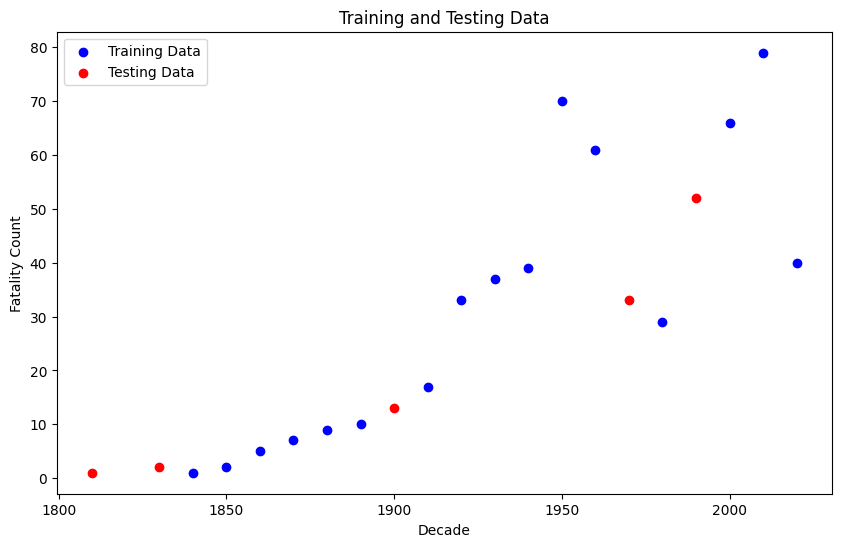

Training data performed better.


In [87]:
#Count fatal attacks by decade
fatal_by_decade = (shark_df[shark_df['Fatal (Y/N)'] == 'Yes'].groupby('Decade').size().reset_index(name='Fatality_By_Decade'))

#Set seed
seed = 42

#Set proportion of data for the test set
test_size = 0.2

#Define input and output features
X = fatal_by_decade[['Decade']]
y = fatal_by_decade['Fatality_By_Decade']

#Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed)

#Intialize and fit the linear model
model = LinearRegression()
model.fit(X_train, y_train)

#Print the model coefficients
print("Model Coefficients:", model.coef_)

#Make predictions on the test set
y_pred = model.predict(X_test)

#Regression metrics on the training dataset
mse_train = mean_squared_error(y_train, model.predict(X_train))
rmse_train = math.sqrt(mse_train)
mae_train = mean_absolute_error(y_train, model.predict(X_train))

#Print MSE, MSA, and Root mean squared error (RMSE)
print("Training MSE:", mse_train)
print("Training RMSE:", rmse_train)
print("Training MAE:", mae_train)

#Print MSE, MSA, and Root mean squared error (RMSE) on testing data
mse_test = mean_squared_error(y_test, y_pred)
print("Testing MSE:", mse_test)
print("Testing RMSE:", math.sqrt(mse_test))
print("Testing MAE:", mean_absolute_error(y_test, y_pred))

#Print R^2 for training and testing
print("R^2 for training:", model.score(X_train, y_train))
print("R^2 for testing:", model.score(X_test, y_test))

#Plot a chart comparing training and test data
plt.figure(figsize=(10, 6))
plt.scatter(X_train, y_train, color='blue', label='Training Data')
plt.scatter(X_test, y_test, color='red', label='Testing Data')

#Add axes labels
plt.xlabel('Decade')
plt.ylabel('Fatality Count')
plt.title('Training and Testing Data')
plt.legend()
plt.show()

#Indicate if training or test performed better
if model.score(X_train, y_train) > model.score(X_test, y_test):
    print("Training data performed better.")
else:
    print("Testing data performed better.")

The results above indicate how well our regression models perform. The goal of one-standard error method for model selection is to find the model with the minimum mean score.

##Summary and Conclusion

###Linear Regression Summary

A simple linear regression model was used to predict whether attacks are becoming increasingly fatal over time. The predictor used the number of historical fatal attacks. This model produced an adjusted R-squared of 72.18, meaning that the number of fatal attacks is increasing over time.

Three multiple linear regression models were also run. The first was run to predict attacks by decade using the following predictors: Fatality, Type (provoked or unprovoked), Activity, and Sex. The adjusted R-squared for this model was 97.63, indicating that the predictors had a strong relationship with the target variable.

The second Multiple LR Model attempted to predict the victim's age based on the Type (provoked or unprovoked) and sex. This model resulted in an adjusted R-squared of .0044, indicating that it failed to predict age with the chosen predictors.

A third multiple LR Model was run by adding a predictor to the second model. The additional predictor used was 'Activity'. This model performed a little better but was determined to still be a poor predictor of Age, based on an adjusted R-squared of .08.

The model with the best performance based on adjusted R-squared was the Multiple LR model that predicted Attacks by decade based on fatality, type, activity, and sex. The scatter plot showing observed vs predicted attacks is well aligned, suggesting that the model may be overfit.

###Logistic Regression Summary

Two Logistic Regression Models were run. The first was run to predict Fatal Attacks using Type (provoked or unprovoked), Sex, and Activity. The model produced an accuracy rate of 82% but was biased towards predicting non-fatal cases. This is likely due to the imbalance in the classes.

A second logistic regression was run to predict hotspts around the world based on attack counts. The model achieved high accuracy results of 97.3%. The confustion matrix positively identified all non-hotspots with no false positives. However, 32 areas were misclassified as non-hotspots resulting in false negatives.

While both models performed well in terms of accuracy, the second logistic regression performed with higher accuracy than the first. Although, accuracy in the models was high, recall, precision, and F1-scores were often low indicating an imbalance in the models.

###Conclusion

The use of both linear and logistic regression models provided valuable insights into shark attack patterns across time, geography, and victim characteristics to better understand the trends and contributing factors behind shark attacks. The simple linear regression model indicated that fatal shark attacks have increased over time. This suggests a concerning trend in the severity or lethality of shark attacks. Among the multiple linear regression models, the strongest performer was the model predicting total attacks by decade based on features like fatality count, attack type, activity, and victim sex. Although this model performed well with an adjusted R-square of 97.6%, this could suggest that the model was overfitted.

The logistic regression models provided insights into classification challenges, primarily class imbalance in accurately predicting non-fatal cases but failing to identify fatal ones reliably.

The second logistic regression model, which aimed to identify global hotspots of shark attacks, performed far better, achieving a high accuracy of 97.3%. It successfully predicted all non-hotspot areas without false positives, although 32 known hotspots were misclassified as non-hotspots. This model showed much stronger generalization, but future improvements could focus on increasing sensitivity to hotspot regions.

In conclusion, a high R-squared doesn’t always mean the model is reliable, and class imbalances severely limit the effectiveness of the classifiers.



#Progress Report #4 - Supervised/Unsupervised Learning

##Supervised Learning

KNN

Predict whether a given incident was fatal or non-fatal using features such as Age, Activity, Type and Sex. To do this the data is first process using encoded categorical variables and the scaled number feature of Age. The data is then split into training and testing sets. KNN uses the 7 nearest neighbors in the training set for each test point to compare predicted values against actual labels to measure accuracy.

Accuracy: 0.7432098765432099
              precision    recall  f1-score   support

           0       0.77      0.92      0.84       860
           1       0.84      0.59      0.70       108
           2       0.42      0.19      0.27       247

    accuracy                           0.74      1215
   macro avg       0.68      0.57      0.60      1215
weighted avg       0.71      0.74      0.71      1215



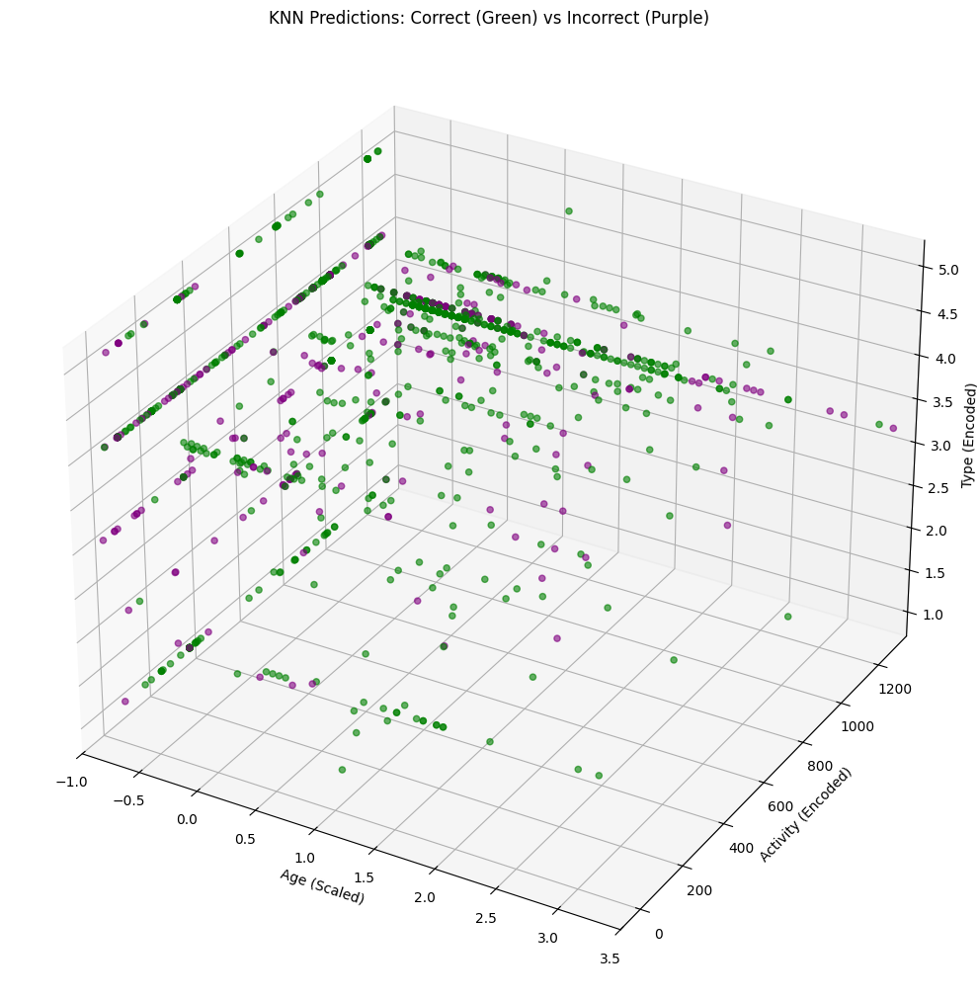

In [88]:
#Standardize Age
combined_df['Age_Scaled'] = preprocessing.scale(combined_df[['Age']])

#Encode catergorical features
le_activity = LabelEncoder()
combined_df['Activity_Label'] = le_activity.fit_transform(combined_df['Activity'])

le_fatal = LabelEncoder()
combined_df['Fatal_Label'] = le_fatal.fit_transform(combined_df['Fatal (Y/N)'])

le_type = LabelEncoder()
combined_df['Type_Label'] = le_type.fit_transform(combined_df['Type'])

le_sex = LabelEncoder()
combined_df['Sex_Label'] = le_sex.fit_transform(combined_df['Sex'])

#Use scaled age
X = combined_df[['Age_Scaled', 'Activity_Label', 'Type_Label', 'Sex_Label']]
y = combined_df['Fatal_Label']

#Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Initialize and train KNN
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train, y_train)

#Predict and evaluate
y_pred = knn.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

#Prepare data for 3D plotting
X_test_plot = X_test.copy()
X_test_plot['Predicted_Fatal'] = y_pred
X_test_plot['Actual_Fatal'] = y_test
X_test_plot['Correct'] = X_test_plot['Predicted_Fatal'] == X_test_plot['Actual_Fatal']

#Create 3D scatter plot
fig = plt.figure(figsize=(10, 11))
ax = fig.add_subplot(111, projection='3d')

#Use different colors for correct/incorrect predictions
colors = X_test_plot['Correct'].map({True: 'green', False: 'purple'})

scatter = ax.scatter(
    X_test_plot['Age_Scaled'],
    X_test_plot['Activity_Label'],
    X_test_plot['Type_Label'],
    c=colors,
    alpha=0.6,
    s=20
)

#Set axis limits
ax.set_xlim(-1, 3.5)  # Limit Age_Scaled to 4

ax.set_title("KNN Predictions: Correct (Green) vs Incorrect (Purple)")
ax.set_xlabel("Age (Scaled)")
ax.set_ylabel("Activity (Encoded)")
ax.set_zlabel("Type (Encoded)")

plt.tight_layout()
plt.show()

This KNN 3D scatter plot visualizes the predictions of the KNN model with X-axis as Age (Scaled) with standardized age values, mean=0, std=1. Y-axis is Activity (Encoded) that runs the activity as numeric values. Z-axis is Type (Encoded) that does the same for type. For the colors in the scatter plot green is correct predictions, which are true positive or true negative and purple is incorrect predicitions, which is false positive or false negative.  

In analyzing the plot, we can see there is a horizontal area of green points along certain activity and type labels, which shows how well the model performs in a certain range of activity and type. Purple points in areas with less data density suggest that the model could stuggle handling some combinations of age, activity, and type. Age_Scaled shows a broad range of values but most are  in the -0.5 to 2.5 range to there being more purple in the lower and higher age ranges, it leads us to believe age is not as strongly connected with the target as other features.

##Unsupervised Learning

Hierarchical Cluster

Hierarchical clustering with dendrogram visualization and cluster cut-cff analysis

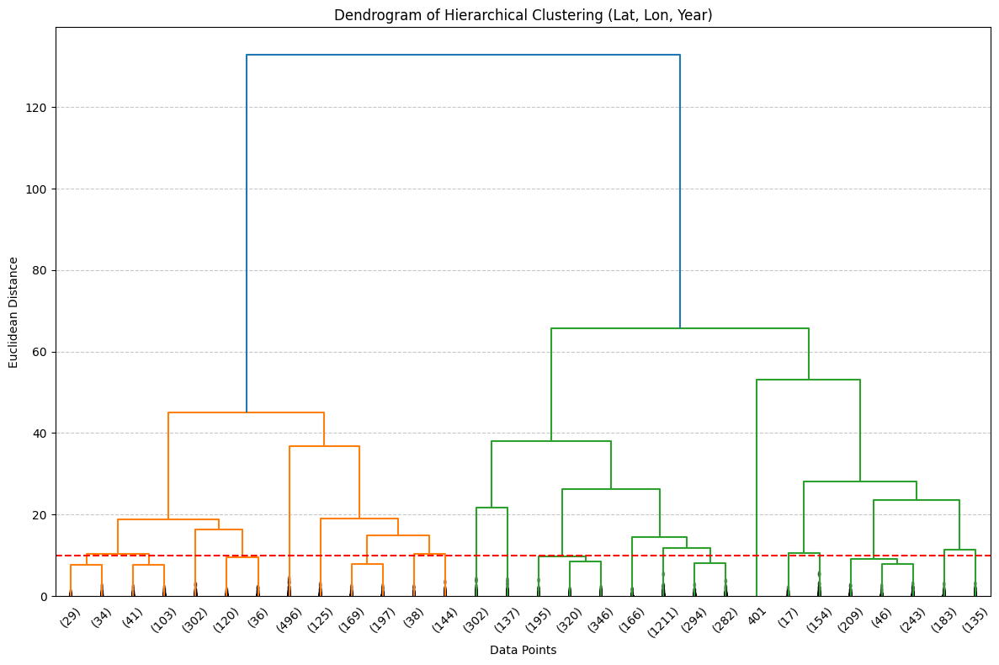

In [89]:
#Extract relevant features for clustering
clustering_data = combined_df[['Lat', 'Lon', 'Year']]

#Replace missing values with the median
clustering_data = clustering_data.fillna(clustering_data.median())

#Standardize data
scaler = StandardScaler()
clustering_data_scaled = scaler.fit_transform(clustering_data)

#Hierarchical Cluster with ward method
linkage_matrix = linkage(clustering_data_scaled, method='ward')

#Dendrogram
plt.figure(figsize=(12,8))
dendrogram(
    linkage_matrix,
    truncate_mode='lastp',
    p=30,
    leaf_rotation=45,
    leaf_font_size=10,
    show_contracted=True
);

#Set a fixed distance threshold
distance_threshold = 10

#Add a horizontal line at the cluster cut-off point
plt.axhline(y=distance_threshold, color='red', linestyle='--', linewidth=1.5)

plt.title("Dendrogram of Hierarchical Clustering (Lat, Lon, Year)")
plt.xlabel("Data Points")
plt.ylabel("Euclidean Distance")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

The dendrogram has two main branches that show two major clusters. The red dashed line shows the distance threshold. Clusters below the line are considered distinct clusters. The right branch has more variability in distance, which shows more dispered clusters. On the left branch the clusters are tighter, which shows a lower Euclidean distance.

Heatmap of Feature Correlations

Cluster distribution analysis and feature correlation heatmap visualization

Cluster Distribution:
{np.int64(0): np.int64(988), np.int64(1): np.int64(1834), np.int64(2): np.int64(3253)}


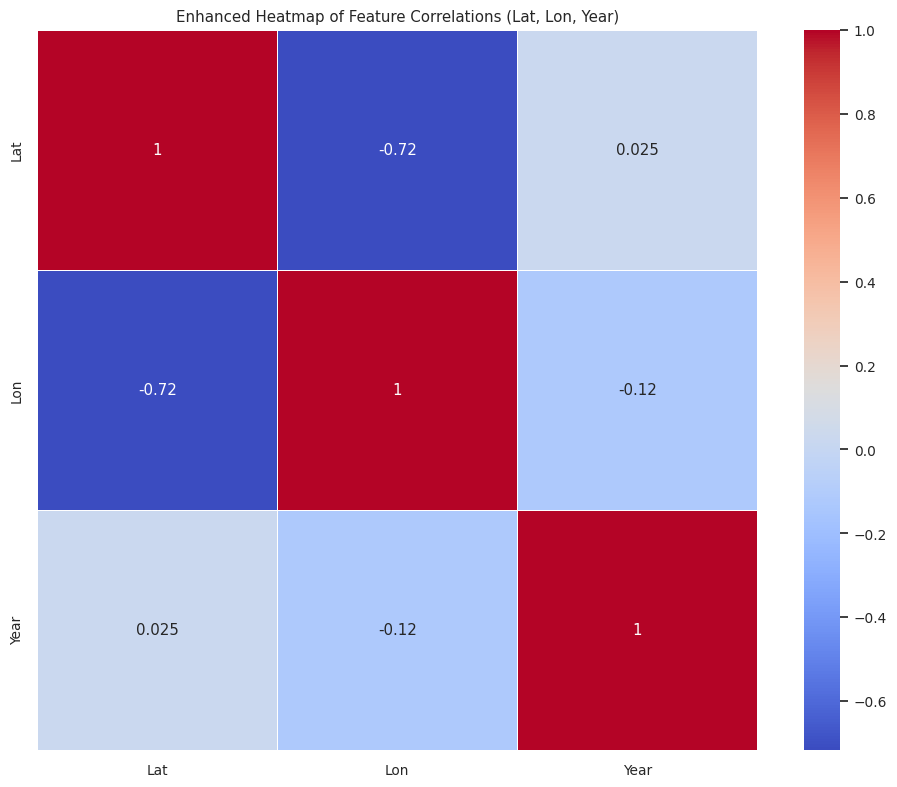

In [94]:
#Perform clustering
clustering_model = AgglomerativeClustering(n_clusters=3)
cluster_labels = clustering_model.fit_predict(clustering_data_scaled)

#Display cluster distribution
unique, counts = np.unique(cluster_labels, return_counts=True)
print(f"Cluster Distribution:\n{dict(zip(unique, counts))}")

correlation_matrix = np.corrcoef(clustering_data_scaled.T)

sns.set(font_scale=0.9)
plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap='coolwarm',
    cbar=True,
    square=True,
    linewidths=0.5,
    xticklabels=['Lat', 'Lon', 'Year'],
    yticklabels=['Lat', 'Lon', 'Year']
)
plt.title("Enhanced Heatmap of Feature Correlations (Lat, Lon, Year)")
plt.tight_layout()
plt.show()

For the cluster distribution, it shows cluster distribution is imbalanced with Cluser 2 beind largert than the others.

For the heatmap analysis, lat and long have a stron negative correlation. As Lat increases, Lon decreases and vice versa. Lat and Year is very weak at 0.025, indicating no linear correlation. Lon and year is also weak at -0.12 showing no linear interaction as well.

# Summary and Conclusion

Supervised Learning - Knn Summary

In this project, we used a K-Nearest Neighbors (KNN) algorithm to predict whether an incident was fatal or non-fatal based on features like Age, Activity, Type, and Sex. We started by scaling the Age feature and encoding the categorical variables so the KNN model could work with them. Then, we split the data into training and testing sets and trained the model using seven neighbors. After training, we evaluated the model using accuracy and a classification report to see how well it performed.

To better understand how the model was making predictions, we created a 3D scatter plot. The axes represent Age (scaled), Activity (encoded), and Type (encoded), and the points are colored based on whether the predictions were correct (green) or incorrect (purple). This visualization helped me see where the model was doing well and struggled.

Unsupervised Learning - Heatmap of Feature Correlations

For this analysis, we used hierarchical clustering to explore patterns in the data using Latitude, Longitude, and Year. We standardized the data to keep everything on the same scale, then created a dendrogram using the Ward method to see how the data naturally grouped. The dendrogram showed two main branches, indicating two clusters, with a red dashed line representing the set distance threshold. The left branch had more compact clusters, while the right branch had more spread-out clusters, suggesting more variability in that group.

We also generated a heatmap to examine the correlations between Latitude, Longitude, and Year. The strongest relationship was a strong negative correlation between Latitude and Longitude, meaning that as one increased, the other decreased. The correlations between Lat and Year and Lon and Year were weak, indicating that time wasn't affecting spatial patterns.

Conclusion

Overall, the KNN model accurately predicted whether incidents were fatal, especially regarding specific activity and type combinations. The scatter plot showed clusters of green points where the model made correct predictions. Still, it struggled more with predictions involving lower and higher age ranges, suggesting that Age might not be as strong of a predictor as the other features. The model made more mistakes in areas with little data, so adjusting the data distribution or fine-tuning the features might help make it more accurate.

The hierarchical clustering and heatmap gave a better look at how the data was structured. The clustering showed two main groups, with one group being more spread out, hinting that some locations might have more diverse attack patterns. The heatmap confirmed that Latitude and Longitude were strongly inversely related but didn't show much connection with the year. Suppose we were to keep working on this. In that case, we suggest refining the feature set, playing around with the clustering parameters, or trying other algorithms to see if any clearer patterns emerge.